In [1]:
import pandas as pd
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import os
from sklearn.datasets import load_iris
from linearmodels.iv import IV2SLS
from statsmodels.formula.api import quantreg, wls
from statsmodels.iolib.summary2 import summary_col
from PIL import Image
from statsmodels.stats.stattools import durbin_watson
from collections import OrderedDict
from linearmodels.iv.results import compare
import doubleml as dml
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import clone
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from doubleml import DoubleMLData, DoubleMLClusterData, DoubleMLPLIV
from doubleml.utils import DMLDummyRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import holidays
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from sklearn.inspection import permutation_importance
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LassoCV

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-t325rr_g because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {'MAE': mae, 'RMSE': rmse, 'R²': r2}

def print_metrics(metrics, dataset_type):
    print(f"{dataset_type} Metrics:")
    print(f"  MAE: {metrics['MAE']:.4f}")
    print(f"  RMSE: {metrics['RMSE']:.4f}")
    print(f"  R²: {metrics['R²']:.4f}")

def evaluate_predictions(predictions, true_values, target_name="TargetVariable", time_values=None):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        time_values (pd.Series): Time values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    # Ensure inputs are aligned
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)
    
    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    
    # Print metrics
    print_metrics(metrics, dataset_type=f"Test - {target_name}")
    
    # Range of the target variable
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min}, Max = {target_max}, Range = {target_range}")
    
    # Percentage errors
    mae_percentage = (metrics['MAE'] / target_range) * 100
    rmse_percentage = (metrics['RMSE'] / target_range) * 100
    
    print(f"MAE as percentage of range: {mae_percentage:.2f}%")
    print(f"RMSE as percentage of range: {rmse_percentage:.2f}%")
    
    # Extract years for coloring
    if time_values is not None:
        unique_years = time_values.unique()
        norm = mcolors.Normalize(vmin=min(unique_years), vmax=max(unique_years))
        cmap = cm.viridis
        colors = cmap(norm(time_values))
    else:
        colors = 'blue'  # Default color if no time_values provided
    
    # Visualizations
    # Scatter plot: Predicted vs Actual
    plt.scatter(true_values, predictions, c=colors, alpha=0.6)
    plt.plot([target_min, target_max], [target_min, target_max], 'r--', label='Perfect prediction')  # Perfect prediction line
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='Year')
    plt.legend()
    plt.show()
    
    # Residuals plot
    residuals = true_values - predictions
    plt.scatter(true_values, residuals, c=colors, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='Year')
    plt.legend()
    plt.show()
    
    # Return metrics and percentages
    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_percentage,
        "RMSE_Percentage": rmse_percentage
    }

In [3]:
def evaluate_predictions_country(predictions, true_values, target_name="TargetVariable", country_values=None, title="Country"):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        country_values (pd.Series or np.ndarray): Country values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    import random
    from matplotlib.colors import ListedColormap

    # Ensure inputs are aligned
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)
    
    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    
    # Print metrics
    print_metrics(metrics, dataset_type=f"Test - {target_name}")
    
    # Range of the target variable
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min}, Max = {target_max}, Range = {target_range}")
    
    # Percentage errors
    mae_percentage = (metrics['MAE'] / target_range) * 100
    rmse_percentage = (metrics['RMSE'] / target_range) * 100
    
    print(f"MAE as percentage of range: {mae_percentage:.2f}%")
    print(f"RMSE as percentage of range: {rmse_percentage:.2f}%")
    
    # Generate distinct colors for each unique country
    if country_values is not None:
        unique_countries = np.unique(country_values)
        num_countries = len(unique_countries)
        
        # Generate a list of random, unique colors
        random.seed(42)  # Ensures reproducibility
        colors = [
            (random.random(), random.random(), random.random()) 
            for _ in range(num_countries)
        ]
        cmap = ListedColormap(colors)
        
        # Map each country to a unique color
        color_mapping = {country: colors[idx] for idx, country in enumerate(unique_countries)}
        dot_colors = [color_mapping[country] for country in country_values]
    else:
        dot_colors = 'blue'  # Default color if no country_values provided
        color_mapping = None
    
    # Visualizations
    # Scatter plot: Predicted vs Actual
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, predictions, c=dot_colors, alpha=0.6)
    plt.plot([target_min, target_max], [target_min, target_max], 'r--', label='Perfect prediction')  # Perfect prediction line
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    if country_values is not None:
        handles = [
            plt.Line2D([0], [0], marker='o', color=color_mapping[country], linestyle='', label=country)
            for country in unique_countries
        ]
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Residuals plot
    plt.figure(figsize=(10, 6))
    residuals = true_values - predictions
    plt.scatter(true_values, residuals, c=dot_colors, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    if country_values is not None:
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Return metrics and percentages
    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_percentage,
        "RMSE_Percentage": rmse_percentage
    }

In [4]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    include_lags=True  # 👈 New flag to include/exclude lags
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])[dependent_variable]
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['RollingStd24h_Price'] = (
        data.groupby(['Country', 'Year'])['DayAheadPriceEUR']
        .transform(lambda x: x.rolling(window=24, min_periods=12).std())
    )

    # Weekend / spike flags
    data['IsWeekend'] = (data['Time'].dt.dayofweek >= 5).astype(int)
    price_threshold = data['DayAheadPriceEUR'].quantile(0.95)
    data['PriceSpike'] = (data['DayAheadPriceEUR'] > price_threshold).astype(int)

    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

    # Step 3: Optionally add lagged features
    lag_features = []
    if include_lags:
        data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
        data['Lag24_Consumption'] = data.groupby('Country')[dependent_variable].shift(24)
        data['Lag168_Consumption'] = data.groupby('Country')[dependent_variable].shift(168)
        lag_features = ['Lag1_Consumption', 'Lag24_Consumption', 'Lag168_Consumption']

    # Step 4: Define covariates
    if base_covariates is None:
        base_covariates = []

    engineered_features = ['RollingMean24h', 'RollingStd24h_Price', 'IsWeekend', 'PriceSpike']
    all_features = base_covariates + engineered_features + lag_features

    for feat in all_features:
        if feat not in base_covariates:
            base_covariates.append(feat)

    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    # Drop NaNs from rolling/lags
    data = data.dropna()

    return data, covariates


In [5]:
def prepare_data(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized'
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])[dependent_variable]
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['RollingStd24h_Price'] = (
        data.groupby(['Country', 'Year'])['DayAheadPriceEUR']
        .transform(lambda x: x.rolling(window=24, min_periods=12).std())
    )

    # Weekend / spike flags
    data['IsWeekend'] = (data['Time'].dt.dayofweek >= 5).astype(int)

    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)


    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]
    endogenous_variable = 'DayAheadPriceEUR'
    instrument_variables = ['Total_Wind_Generation']  # adapt to your case
    
    key_variables = [dependent_variable, endogenous_variable] + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)


    return filtered_processed_data, covariates

In [6]:
def dml_rolling_window(filtered_data, base_covariates, manual_params_l=None, manual_params_r = None, manual_params_m=None, param_dist_xgb=None, dependent_variable = 'consumption_normalized'):
    
    data = filtered_data.copy()
    
    covariates = base_covariates.copy()
    

    # Initialize lists to collect predictions and time indices
    predictions_ml_l = []
    predictions_ml_r = []
    predictions_ml_m = []
    time_indices = []
    train_predictions = []
    train_actuals = []
    test_predictions = []
    test_actuals = []
    feature_importances_per_window = []
    fold_metrics = []
    test_years = []
    fold_feature_importance_df = []
    fold_coefficients = []

    

    train_test_pairs = [
    (2015, 2016, 2017),
    (2016, 2017, 2018),
    (2017, 2018, 2019),
    (2018, 2019, 2020),
    (2019, 2020, 2021),
    (2020, 2021, 2022),
    (2021, 2022, 2023),
    (2022, 2023, 2024)]
    
    
    def tune_xgb_model(X, y):
        tscv = TimeSeriesSplit(n_splits=3)
        model = xgb.XGBRegressor(objective="reg:squarederror", tree_method="hist", eval_metric="rmse")
        grid_search = GridSearchCV(model, param_dist_xgb, cv=tscv, n_jobs=-1)
        grid_search.fit(X, y)
        return grid_search.best_params_
        
    best_params_xgb = None  # Store best params from first window
    best_params_xgb_treat = None
    best_params_xgb_inst = None
    lasso_param = None
    
    data['Year'] = data['Time'].dt.year
    year_to_indices = data.groupby('Year').indices

    
    
    for train_start, train_end, test_year in train_test_pairs:
        train_indices = []
        for y in range(train_start, train_end + 1):
            if y in year_to_indices:
                train_indices.extend(year_to_indices[y])

        test_indices = year_to_indices.get(test_year, [])

        if len(train_indices) == 0 or len(test_indices) == 0:
            print(f"Skipping test year {test_year} due to insufficient data.")
            continue
        
        train_data = data.iloc[train_indices]
        test_data = data.iloc[test_indices]



        print(f"\nTest Year: {test_year} | Training Years: {train_start} to {train_end}")
        print(f"Train samples: {len(train_indices)} | Test samples: {len(test_indices)}")


        X_train = train_data[covariates]
        y_train_ml_l = train_data[dependent_variable]
        d_train_ml_r = train_data['DayAheadPriceEUR']
        z_train_ml_m_1 = train_data['Total_Wind_Generation']
        
        
        if best_params_xgb is None and manual_params_l is None:
            best_params_xgb = tune_xgb_model(X_train, y_train_ml_l)
            print("Best L Parameters:", best_params_xgb)
        
        if best_params_xgb_treat is None and manual_params_r is None:
            best_params_xgb_treat = tune_xgb_model(X_train, d_train_ml_r)
            print("Best R Parameters:", best_params_xgb_treat)
            
            
        if best_params_xgb_inst is None and manual_params_m is None:
            best_params_xgb_inst = tune_xgb_model(X_train, z_train_ml_m_1)
            print("Best M Parameters:", best_params_xgb_inst)
            
        learner_l = xgb.XGBRegressor(**(manual_params_l if manual_params_l else best_params_xgb))
        learner_r = xgb.XGBRegressor(**(manual_params_r if manual_params_r else best_params_xgb_treat))
        learner_m = xgb.XGBRegressor(**(manual_params_m if manual_params_m else best_params_xgb_inst))
            # Train each model on the training set (fixed window)
        learner_l.fit(X_train, y_train_ml_l)
        learner_r.fit(X_train, d_train_ml_r)
        learner_m.fit(X_train, z_train_ml_m_1)
            
        feature_importances_per_window.append(learner_l.feature_importances_)

            # Predict on the test set (next year)
        X_test = test_data[covariates]
        y_test_ml_l = test_data[dependent_variable]
        d_test_ml_r = test_data['DayAheadPriceEUR']
        z_test_ml_m_1 = test_data['Total_Wind_Generation']
        pred_l = learner_l.predict(X_test)
        pred_r = learner_r.predict(X_test)
        pred_m = learner_m.predict(X_test)
            
            # Predict on the train set (next year)
        train_predictions.extend(learner_l.predict(X_train))
        train_actuals.extend(y_train_ml_l)
        test_predictions.extend(learner_l.predict(X_test))
        test_actuals.extend(y_test_ml_l)

            # Append predictions and indices to the lists
        predictions_ml_l.extend(pred_l)
        predictions_ml_r.extend(pred_r)
        predictions_ml_m.extend(pred_m)
        time_indices.extend(test_data.index.tolist())
        
        plt.figure(figsize=(12, 4))
        plt.plot(test_actuals[:500], label='Actual')
        plt.plot(test_predictions[:500], label='Predicted')
        plt.title("First 500 test predictions vs actuals")
        plt.legend()
        plt.show()
        
        fold_mae = mean_absolute_error(y_test_ml_l, pred_l)
        fold_rmse = mean_squared_error(y_test_ml_l, pred_l, squared=False)
        fold_r2 = r2_score(y_test_ml_l, pred_l)
        fold_rr = r2_score(d_test_ml_r, pred_r)
        fold_rz = r2_score(z_test_ml_m_1, pred_m)
        print("Test error l:", fold_r2)
        print("Test error r:", fold_rr)
        print("Test error m:", fold_rz)
        
        fold_metrics.append({
            'Test Year': test_year,
            'MAE': fold_mae,
            'RMSE': fold_rmse,
            'R2': fold_r2
        })
        test_years.append(test_year)
        
        fold_feature_importance_df.append(pd.DataFrame({
            'Feature': covariates,
            'Importance': learner_l.feature_importances_,
            'Year': test_year
        }))
        
        dml_data_fold = dml.DoubleMLClusterData(
            test_data.reset_index(drop=True),
            y_col=dependent_variable,
            d_cols='DayAheadPriceEUR',
            z_cols='Total_Wind_Generation',
            x_cols=covariates,
            cluster_cols=['Country']
        )
        
        dml_fold = dml.DoubleMLPLIV(dml_data_fold, dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor())
        dml_fold.fit(external_predictions={
            'DayAheadPriceEUR': {
                'ml_l': pred_l.reshape(-1, 1),
                'ml_r': pred_r.reshape(-1, 1),
                'ml_m': pred_m.reshape(-1, 1)
            }
        })
        fold_coefficients.append({
            'Year': test_year,
            'coef': dml_fold.coef,
            'se': dml_fold.se,
            't': dml_fold.t_stat,
            'p': dml_fold.pval,
        })


    # Calculate metrics for the entire model
    train_mae = mean_absolute_error(train_actuals, train_predictions)
    train_rmse = mean_squared_error(train_actuals, train_predictions, squared=False)
    train_r2 = r2_score(train_actuals, train_predictions)

    test_mae = mean_absolute_error(test_actuals, test_predictions)
    test_rmse = mean_squared_error(test_actuals, test_predictions, squared=False)
    test_r2 = r2_score(test_actuals, test_predictions)

    print("Overall Train Metrics:")
    print(f"MAE: {train_mae}, RMSE: {train_rmse}, R²: {train_r2}")

    print("Overall Test Metrics:")
    print(f"MAE: {test_mae}, RMSE: {test_rmse}, R²: {test_r2}")

    
    
    feature_importances_array = np.array(feature_importances_per_window)
    mean_importances = feature_importances_array.mean(axis=0)
    std_importances = feature_importances_array.std(axis=0)
    importance_df = pd.DataFrame({
        'Feature': covariates,
        'Mean Importance': mean_importances,
        'Std Importance': std_importances
    }).sort_values(by='Mean Importance', ascending=False)
    

    # Convert predictions lists to numpy arrays
    filtered_data = data.loc[data.index.isin(time_indices)].copy()
    
    #### predictins dataset? original dataset?

    predictions_ml_l = np.array(predictions_ml_l).reshape(-1, 1)
    predictions_ml_r = np.array(predictions_ml_r).reshape(-1, 1)
    predictions_ml_m = np.array(predictions_ml_m).reshape(-1, 1)


    pred_dict = {
        'DayAheadPriceEUR': {
            'ml_l': predictions_ml_l,
            'ml_r': predictions_ml_r,
            'ml_m': predictions_ml_m
        }
    }

    # Initialize DoubleML data object
    obj_dml_data = dml.DoubleMLClusterData(
        filtered_data,
        y_col=dependent_variable,
        d_cols='DayAheadPriceEUR',
        z_cols='Total_Wind_Generation',  # Use original instruments (not the lags) for DoubleML
        x_cols=covariates,
        cluster_cols=['Country']
    )
    # Use dummy regressors for DoubleML
    ml_l = dml.utils.DMLDummyRegressor()
    ml_m = dml.utils.DMLDummyRegressor()
    ml_r = dml.utils.DMLDummyRegressor()

    # Initialize and fit DoubleML with external predictions
    dml_pliv_obj = dml.DoubleMLPLIV(obj_dml_data, ml_l, ml_m, ml_r)
    dml_pliv_obj.fit(external_predictions=pred_dict)

    print(dml_pliv_obj)
    filtered_data["Prrediction"] = dml_pliv_obj.predictions["ml_l"].ravel()
    filtered_data["Residuals"] = dml_pliv_obj.predictions["ml_l"].ravel() - filtered_data[dependent_variable]
    importance_all_folds_df = pd.concat(fold_feature_importance_df, ignore_index=True)
    fold_metrics_df = pd.DataFrame(fold_metrics)
    
    
    
    return dml_pliv_obj, filtered_data, importance_df, fold_metrics_df, importance_all_folds_df, fold_coefficients

In [ ]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    apply_log_transform=True
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data = data[data["PriceArea"] != "IT_CALA"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']

    # Normalize consumption
    data['consumption_normalized'] = (
        data['ConsumptionValue'] /
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] /
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
    data['Lag1_Total_Wind_Generation'] = data.groupby('Country')['Total_Wind_Generation'].shift(1)
    data['Lag2_Total_Wind_Generation'] = data.groupby('Country')['Total_Wind_Generation'].shift(2)
    data['Lag1_DayAheadPriceEUR'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)

    # Filter for log-log: remove non-positive values
    if apply_log_transform:
        log_vars = [
            'consumption_normalized', 'DayAheadPriceEUR', 'Lag1_Consumption', 'Lag1_DayAheadPriceEUR',
            'Total_Wind_Generation', 'Lag1_Total_Wind_Generation', 'Lag2_Total_Wind_Generation',
            'Price_gas', 'Price_coal', 'Price_EUA', 'Solar_MWh'
        ]
        for col in log_vars:
            data = data[data[col] > 0]

        # Apply log transformation
        data['log_consumption'] = np.log(data['consumption_normalized'])
        data['log_DayAheadPriceEUR'] = np.log(data['DayAheadPriceEUR'])
        data['log_Lag1_DayAheadPriceEUR'] = np.log(data['Lag1_DayAheadPriceEUR'])
        data['log_Lag1_Consumption'] = np.log(data['Lag1_Consumption'])
        data['log_Total_Wind_Generation'] = np.log(data['Total_Wind_Generation'])
        data['log_Lag1_Total_Wind_Generation'] = np.log(data['Lag1_Total_Wind_Generation'])
        data['log_Lag2_Total_Wind_Generation'] = np.log(data['Lag2_Total_Wind_Generation'])
        data['log_Price_gas'] = np.log(data['Price_gas'])
        data['log_Price_coal'] = np.log(data['Price_coal'])
        data['log_Price_EUA'] = np.log(data['Price_EUA'])
        data['log_Solar_MWh'] = np.log(data['Solar_MWh'])

        # Update base_covariates and include_interactions
        if base_covariates:
            base_covariates = [f"log_{var}" if var in log_vars else var for var in base_covariates]
        if include_interactions:
            for k, v in include_interactions.items():
                include_interactions[k] = [f"log_{x}" if x in log_vars else x for x in v]

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)
    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Interactions
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]
    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

    # Covariates
    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    if apply_log_transform:
        dependent_variable = 'log_consumption'
        endogenous_variable = ['log_DayAheadPriceEUR', 'log_Lag1_Consumption', 'log_Lag1_DayAheadPriceEUR']
        instrument_variables = ['log_Total_Wind_Generation', 'log_Lag1_Total_Wind_Generation', 'log_Lag2_Total_Wind_Generation']
    else:
        endogenous_variable = ['DayAheadPriceEUR', 'Lag1_Consumption', 'Lag1_DayAheadPriceEUR']
        instrument_variables = ['Total_Wind_Generation', 'Lag1_Total_Wind_Generation', 'Lag2_Total_Wind_Generation']

    key_variables = [dependent_variable] + endogenous_variable + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates


In [7]:
data_1 = pd.read_csv('/workspace/new_data/filtered_data_with_holidays_updated.csv', index_col=0)
data_1

,Unnamed: 0,Time,PriceArea,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Month,Day,...,YearMonthDay,Price_Area,Price_gas,Price_coal,Price_EUA,IsHoliday,B16,B18,B19,Price_gas_ttf
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
0.0,0.0,2015-01-01 01:00:00,CH,7654.0,38.08,3.647062,267.706482,2015.0,1.0,1.0,...,2015-01-01,cegh,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
1.0,17.0,2015-01-01 01:00:00,SK,2728.0,22.06,3.991796,265.239655,2015.0,1.0,1.0,...,2015-01-01,cz,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
2.0,16.0,2015-01-01 01:00:00,SI,1045.0,22.20,4.172168,265.189819,2015.0,1.0,1.0,...,2015-01-01,cegh,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
3.0,15.0,2015-01-01 01:00:00,PT,5124.0,47.33,6.417383,279.455658,2015.0,1.0,1.0,...,2015-01-01,cz,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
4.0,10.0,2015-01-01 01:00:00,DK_2,1305.0,16.04,10.561893,276.635590,2015.0,1.0,1.0,...,2015-01-01,etf,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2025-01-01 00:00:00,SE_2,1791.0,3.69,3.096981,262.690735,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,0.0,NaN,243.0,NaN
NaN,NaN,2025-01-01 00:00:00,SE_3,9658.0,2.47,7.332158,272.276581,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,0.0,NaN,2131.0,NaN
NaN,NaN,2025-01-01 00:00:00,SE_4,2146.0,2.04,14.230573,276.445221,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,1.0,NaN,1849.0,NaN


In [45]:
rows_to_remove = [
    ("2022-02-10 20:00:00", "SE_2"),
    ("2022-02-10 21:00:00", "SE_2"),
    ("2022-02-10 22:00:00", "SE_2"),
    ("2020-02-27 09:00:00", "DK_2"),
    ("2024-10-22 14:00:00", "DK_2"),
    ("2017-05-08 07:00:00", "DK_1"),
    ("2018-02-06 12:00:00", "DK_2"),
    ("2021-12-20 18:00:00", "IT_CALA"),
    ("2021-12-20 16:00:00", "IT_CALA"),
    ("2021-12-21 09:00:00", "IT_CALA"),
    ("2021-12-17 18:00:00", "IT_CALA"),
    ("2021-12-20 08:00:00", "IT_CALA"),
    ("2021-12-20 15:00:00", "IT_CALA"),
    ("2021-12-21 12:00:00", "IT_CALA"),
    ("2022-01-25 08:00:00", "IT_CALA"),
    ("2021-12-21 11:00:00", "IT_CALA"),
    ("2021-12-20 19:00:00", "IT_CALA"),
    ("2017-05-08 06:00:00", "DK_1"),
    ("2021-12-21 08:00:00", "IT_CALA"),
    ("2021-11-29 16:00:00", "IT_CALA"),
    ("2021-12-17 16:00:00", "IT_CALA")
]
data_1['Time'] = pd.to_datetime(data_1['Time'])
for time_str, country in rows_to_remove:
    timestamp = pd.to_datetime(time_str)
    data_1 = data_1[~((data_1['Time'] == timestamp) & (data_1['PriceArea'] == country))]

# Normalise

## naiveIV:CIV(Wt |Pt →Dt |∅)

In [46]:
processed_data, covariates = prepare_data(
    data_1,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_normalized'
)

In [47]:
processed_data = processed_data[processed_data['Time'].dt.year != 2025]

In [10]:
processed_data

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_3.0:Solar_MWh,block_4.0:tempbin,block_4.0:tempbin2,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
0.0,0.0,2015-01-01 01:00:00,7654.00,38.08,3.647062,267.706482,2015,1.0,1.0,22.201667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1.0,17.0,2015-01-01 01:00:00,2728.00,22.06,3.991796,265.239655,2015,1.0,1.0,17.761378,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2.0,16.0,2015-01-01 01:00:00,1045.00,22.20,4.172168,265.189819,2015,1.0,1.0,17.671675,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3.0,15.0,2015-01-01 01:00:00,5124.00,47.33,6.417383,279.455658,2015,1.0,1.0,43.350184,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4.0,10.0,2015-01-01 01:00:00,1305.00,16.04,10.561893,276.635590,2015,1.0,1.0,38.274061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.600229,0.0
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.527677,0.0
NaN,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.663050,0.0


In [11]:
param_dist_xgb = {
    'n_estimators': [300, 500, 700],              # More trees to capture seasonality
    'max_depth': [5, 7, 9],                       # Deeper trees for complexity
    'learning_rate': [0.01, 0.05],                # Low learning rate for stable learning
    'subsample': [0.7, 0.9],                      # Try slightly more aggressive subsampling
    'colsample_bytree': [0.7, 0.9],               # Feature subsampling for generalization
    'reg_lambda': [0, 0.1, 1],                    # L2 regularization
    'reg_alpha': [0, 0.1, 1]                      # L1 regularization
}


In [ ]:
dml_pliv_obj, filtered_data, importance_df, fold_metrics_df, importance_all_folds_df, fold_coefficients = dml_rolling_window(processed_data, 
                                                                                                                             covariates, 
                                                                                                                             param_dist_xgb=param_dist_xgb,
                                                                                                                             dependent_variable = 'consumption_normalized')
                                                                                                                            


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209957


In [12]:
manual_params_l = {
    'colsample_bytree': 0.9,
    'learning_rate': 0.05,
    'max_depth': 9,
    'n_estimators': 300,
    'reg_alpha': 0,
    'reg_lambda': 0.1,
    'subsample': 0.7,
    'tree_method': 'hist'
}

manual_params_r = {
    'colsample_bytree': 0.7,
    'learning_rate': 0.05,
    'max_depth': 9,
    'n_estimators': 300,
    'reg_alpha': 1,
    'reg_lambda': 1,
    'subsample': 0.7,
    'tree_method': 'hist'
}

manual_params_m = {
    'colsample_bytree': 0.7,
    'learning_rate': 0.01,
    'max_depth': 5,
    'n_estimators': 300,
    'reg_alpha': 1,
    'reg_lambda': 1,
    'subsample': 0.7,
    'tree_method': 'hist'
}



Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209957


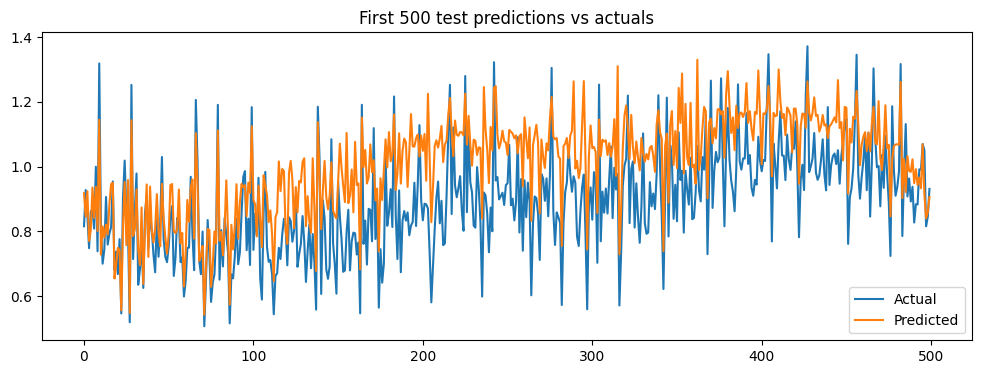

Test error l: 0.7526060741345675
Test error r: 0.3531700516588643
Test error m: 0.5497014693404667

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412299 | Test samples: 203210


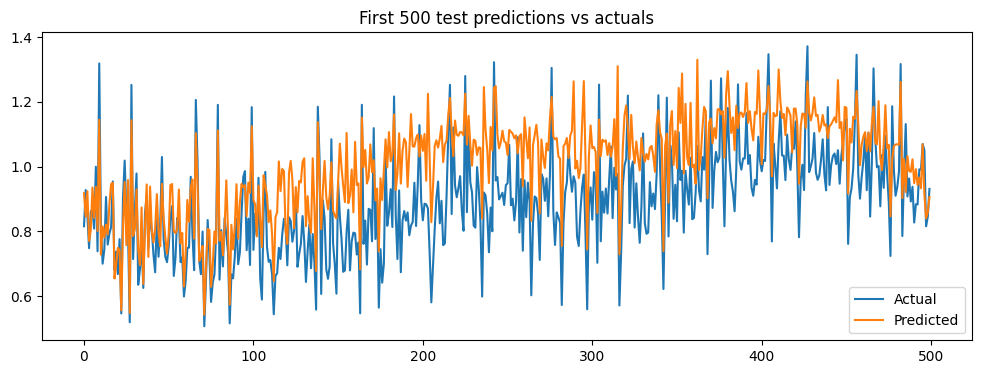

Test error l: 0.5838074039590578
Test error r: -0.07001645679528523
Test error m: 0.594850988424296

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413167 | Test samples: 221271


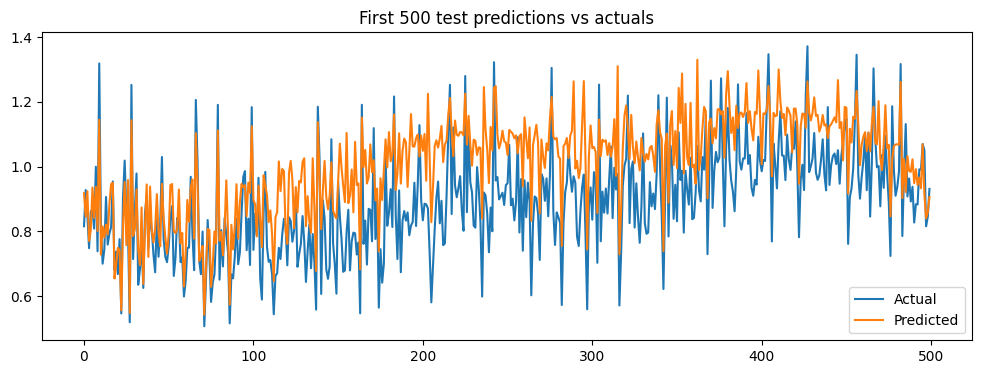

Test error l: 0.6346594474959089
Test error r: 0.2868160447490594
Test error m: 0.6090409711220182

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424481 | Test samples: 234727


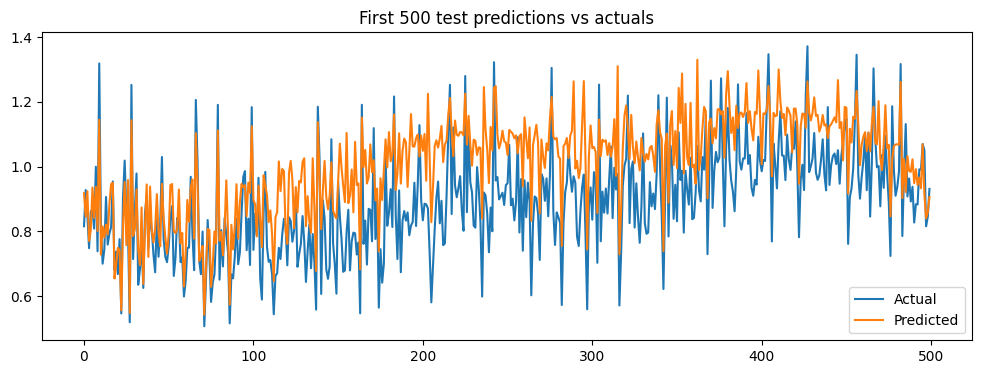

Test error l: 0.7341162781137895
Test error r: 0.13213699926901823
Test error m: 0.5777219804961853

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455998 | Test samples: 252370


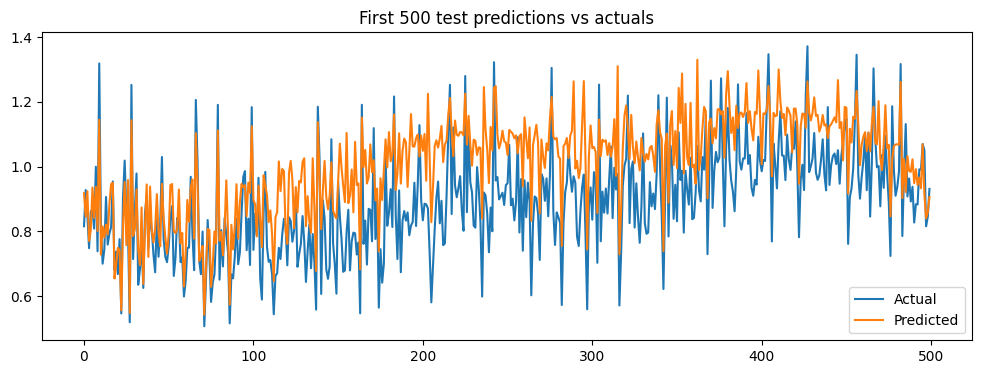

Test error l: 0.5538377946137054
Test error r: -0.8163458677839144
Test error m: 0.20381928669712301

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487097 | Test samples: 282863


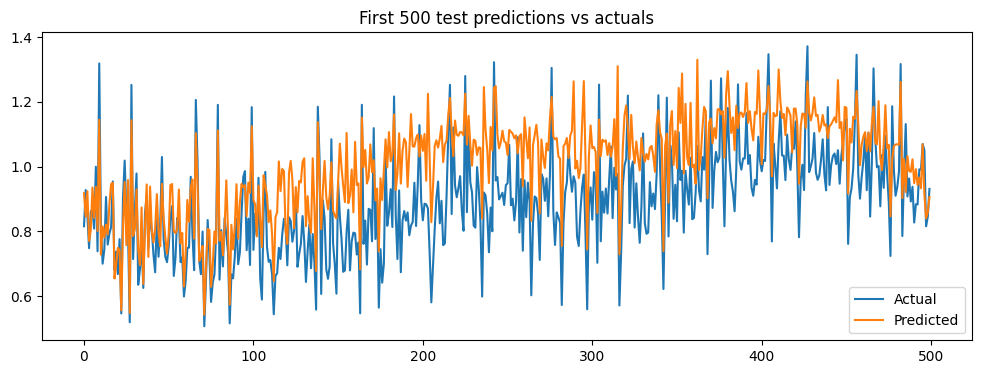

Test error l: 0.467257539015946
Test error r: 0.40838353033023533
Test error m: 0.6059096893360902

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535233 | Test samples: 289871


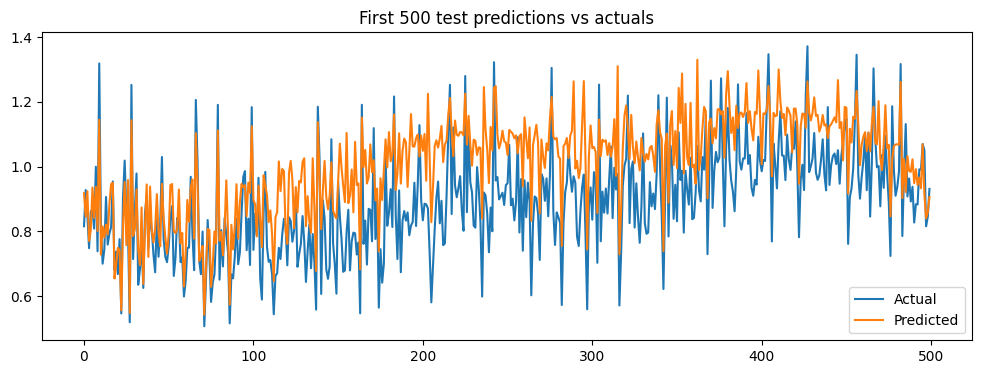

Test error l: 0.6421686426017101
Test error r: 0.28501907778598934
Test error m: 0.5673531534257615

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572734 | Test samples: 304065


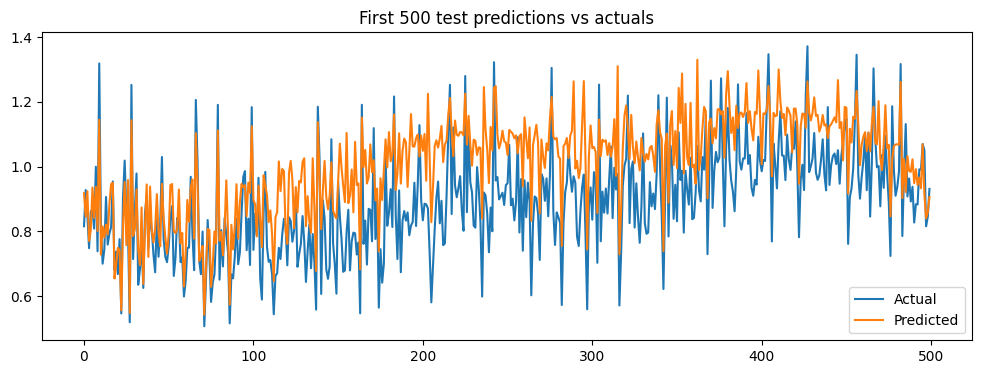

Test error l: 0.6364331012437032
Test error r: 0.12988578427461717
Test error m: 0.6089481388651627
Overall Train Metrics:
MAE: 0.05741443927721128, RMSE: 0.07597003942609545, R²: 0.8429130618163945
Overall Test Metrics:
MAE: 0.08879760723128176, RMSE: 0.12022227153671725, R²: 0.6203784392633823
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_104', 'HourOfWeek_161', 'HourOfWeek_2', 'HourOfWeek_86', 'HourOfWeek_92', 'HourOfWeek_72', 'HourOfWeek_128', 'PriceArea_IT_SARD', 'HourOfWeek_101', 'Month_6', 'HourOfWeek_25', 'HourOfWeek_95', 'HourOfWeek_156', 'HourOfWeek_118', 'HourOfWeek_54', 'HourOfWeek_145', 'block_1.0:Solar_MWh', 'HourOfWeek_15', 'HourOfWeek_43', 'PriceArea_LT', 'HourOfWeek_96', 'HourOfWeek_23', 'HourOfWeek_166', 'HourOfWeek_155', 'HourOfWeek_4', 'HourOfWeek_85', 'Hour

In [13]:
dml_pliv_obj, filtered_data, importance_df, fold_metrics_df, importance_all_folds_df, fold_coefficients = dml_rolling_window(
    processed_data,
    covariates,
    dependent_variable='consumption_normalized',
    manual_params_l=manual_params_l,
    manual_params_r=manual_params_r,
    manual_params_m=manual_params_m
)


In [14]:
importance_df

,Feature,Mean Importance,Std Importance
236,block_6.0:tempbin,0.039654,0.012311
212,HourOfWeek_149,0.038438,0.004152
220,block_1.0:tempbin2,0.037534,0.004907
63,HourOfWeek_150,0.028750,0.003088
221,HourOfWeek_125,0.026908,0.002734
...,...,...,...
10,HourOfWeek_25,0.000021,0.000017
218,HourOfWeek_121,0.000019,0.000013
3,HourOfWeek_86,0.000013,0.000012
171,PriceArea_NO_1,0.000000,0.000000


In [15]:
filtered_data.to_csv("first_normalise.csv", index=False)
importance_df.to_csv("first_normalise_importance_df.csv", index=False)
fold_coefficients.to_csv("first_normalise_fold_coefficients.csv", index=False)

AttributeError: 'list' object has no attribute 'to_csv'

In [12]:
filtered_data = pd.read_csv('first_normalise.csv')

In [14]:
filtered_data.columns

Index(['Unnamed: 0', 'Time', 'ConsumptionValue', 'DayAheadPriceEUR',
       'WeatherWindSpeed', 'WeatherTemperature', 'Year', 'Day', 'Hour',
       'WeatherTemperature_F',
       ...
       'block_4.0:tempbin2', 'block_4.0:Solar_MWh', 'block_5.0:tempbin',
       'block_5.0:tempbin2', 'block_5.0:Solar_MWh', 'block_6.0:tempbin',
       'block_6.0:tempbin2', 'block_6.0:Solar_MWh', 'Prrediction',
       'Residuals'],
      dtype='object', length=277)

Test - consumption_normalized Metrics:
  MAE: 0.0888
  RMSE: 0.1202
  R²: 0.6204
consumption_normalized Range: Min = 0.0, Max = 4.910286383237652, Range = 4.910286383237652
MAE as percentage of range: 1.81%
RMSE as percentage of range: 2.45%


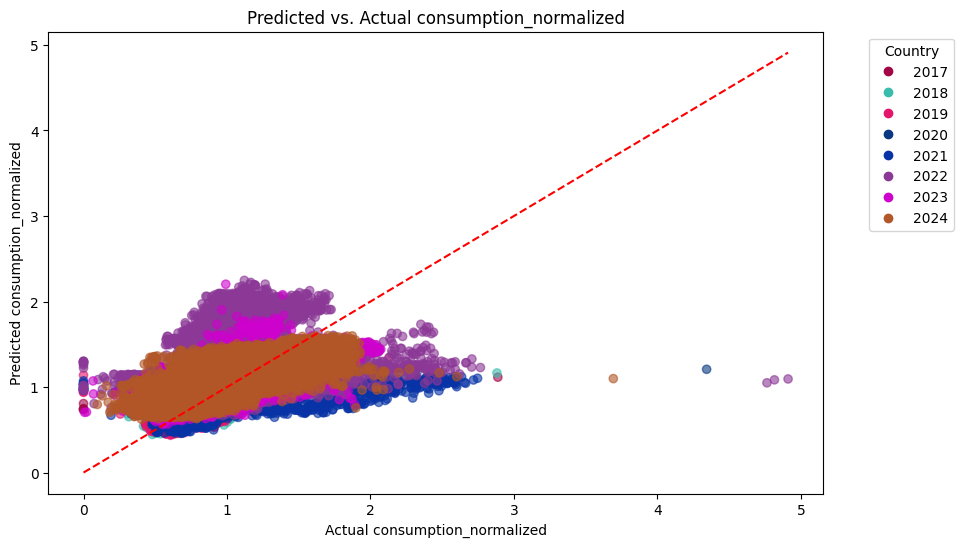

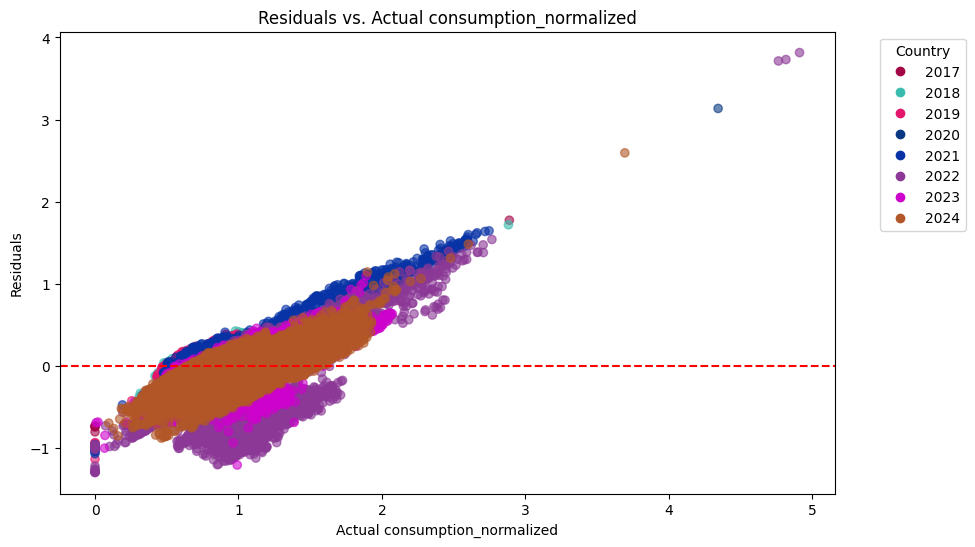

In [15]:
result = evaluate_predictions_country(
    predictions=filtered_data['Prrediction'],
    true_values=filtered_data['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data['Year']  # Use the Country column
)

In [20]:
# Define threshold for outliers
threshold = 1.5  # adjust based on your use case

# Find outlier rows based on residuals
outliers = filtered_data[filtered_data['Residuals'].abs() > threshold]

# Show summary
print("Number of outliers:", outliers.shape[0])
print(outliers[['Time', 'Country', 'consumption_normalized', 'Prrediction', 'Residuals', 'Year']].sort_values(by='Residuals'))


Number of outliers: 21
                        Time  Country  consumption_normalized  Prrediction  \
1154812  2022-02-10 20:00:00     SE_2                4.910286     1.094523   
1154855  2022-02-10 21:00:00     SE_2                4.815290     1.084240   
1154881  2022-02-10 22:00:00     SE_2                4.763157     1.049606   
670216   2020-02-27 09:00:00     DK_2                4.342587     1.207666   
1939417  2024-10-22 14:00:00     DK_2                3.692458     1.098914   
73252    2017-05-08 07:00:00     DK_1                2.887625     1.115175   
230075   2018-02-06 12:00:00     DK_2                2.881371     1.164766   
1112372  2021-12-20 18:00:00  IT_CALA                2.746298     1.102681   
1112307  2021-12-20 16:00:00  IT_CALA                2.718131     1.082604   
1112883  2021-12-21 09:00:00  IT_CALA                2.663205     1.044304   
1109932  2021-12-17 18:00:00  IT_CALA                2.654755     1.053797   
1112027  2021-12-20 08:00:00  IT_CALA    

In [16]:
covariates

['HourOfWeek_67',
 'HourOfWeek_5',
 'HourOfWeek_130',
 'HourOfWeek_141',
 'HourOfWeek_166',
 'PriceArea_RO',
 'HourOfWeek_162',
 'HourOfWeek_51',
 'HourOfWeek_83',
 'HourOfWeek_138',
 'HourOfWeek_152',
 'HourOfWeek_116',
 'HourOfWeek_32',
 'HourOfWeek_104',
 'block_6.0:tempbin2',
 'HourOfWeek_159',
 'HourOfWeek_158',
 'PriceArea_BG',
 'Month_10',
 'HourOfWeek_13',
 'HourOfWeek_85',
 'PriceArea_IT_SARD',
 'HourOfWeek_137',
 'HourOfWeek_146',
 'block_6.0:Solar_MWh',
 'PriceArea_SK',
 'HourOfWeek_101',
 'HourOfWeek_29',
 'Month_4',
 'HourOfWeek_59',
 'HourOfWeek_64',
 'PriceArea_IT_SICI',
 'HourOfWeek_77',
 'HourOfWeek_103',
 'HourOfWeek_153',
 'HourOfWeek_24',
 'PriceArea_SE_4',
 'block_5.0:Solar_MWh',
 'HourOfWeek_3',
 'HourOfWeek_22',
 'HourOfWeek_160',
 'PriceArea_LT',
 'HourOfWeek_69',
 'PriceArea_GR',
 'PriceArea_IT_CNOR',
 'HourOfWeek_117',
 'Month_9',
 'HourOfWeek_48',
 'Month_7',
 'block_3.0:Solar_MWh',
 'block_6.0:tempbin',
 'PriceArea_FI',
 'HourOfWeek_9',
 'HourOfWeek_98',
 'H

In [21]:
# Step 1: Define outliers in filtered_data
threshold = 1.5
outliers = filtered_data[filtered_data['Residuals'].abs() > threshold]

# Step 2: Get the indices of those outliers
outlier_indices = outliers.index

# Step 3: Drop the same rows from processed_data
processed_data_cleaned = processed_data.drop(index=outlier_indices).copy()

# Optional: confirm
print("Original:", processed_data.shape)
print("Cleaned:", processed_data_cleaned.shape)


Original: (2400152, 275)
Cleaned: (2400131, 275)


## Test another hypoparameters

In [37]:
param_dist_xgb = {
    'n_estimators': [500, 700, 1000],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.03]
}


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401815 | Test samples: 209957
Best L Parameters: {'learning_rate': 0.03, 'max_depth': 8, 'n_estimators': 500}


/.local/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best R Parameters: {'learning_rate': 0.03, 'max_depth': 8, 'n_estimators': 500}
Best M Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500}


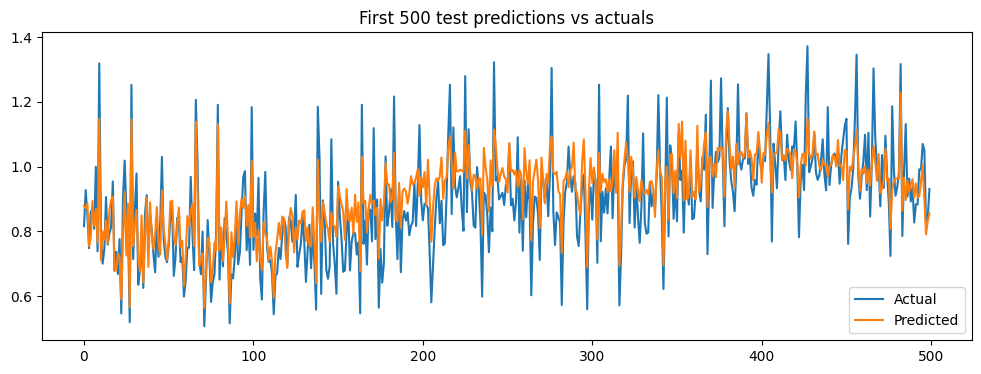

Test error l: 0.7121776408890516
Test error r: 0.3192987470065135
Test error m: 0.5183119038264641

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412298 | Test samples: 203209


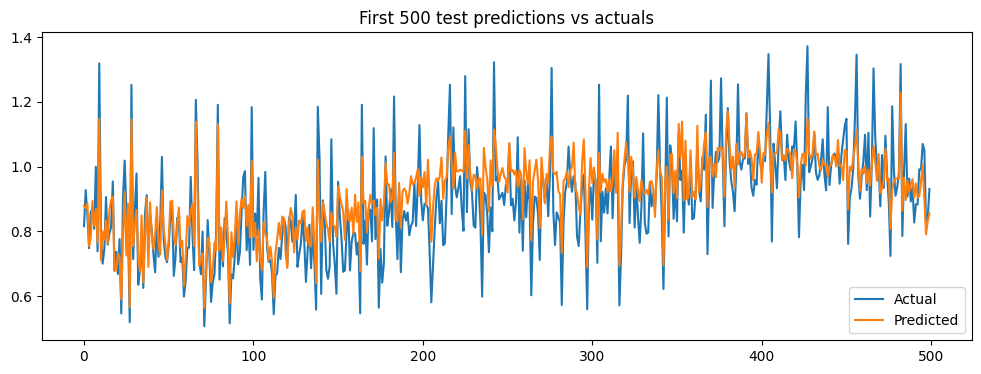

Test error l: 0.5884808270436039
Test error r: -0.2883852500413566
Test error m: 0.48370444133886303

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413166 | Test samples: 221263


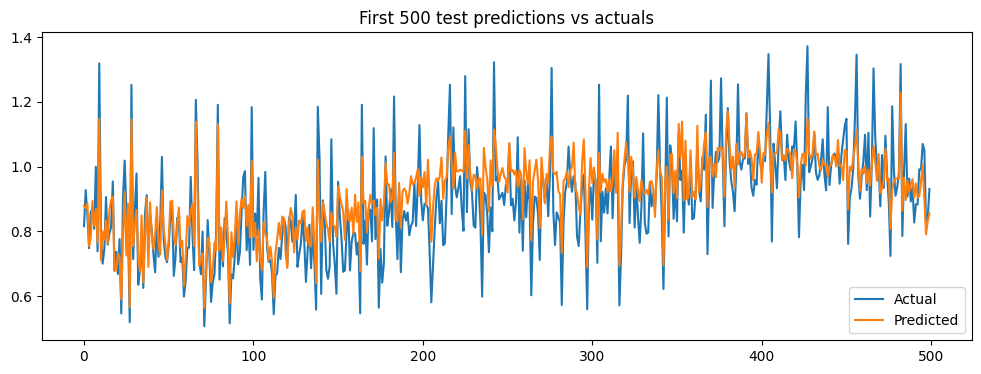

Test error l: 0.7004862759483651
Test error r: 0.27293438948101
Test error m: 0.5659175117762734

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424472 | Test samples: 234719


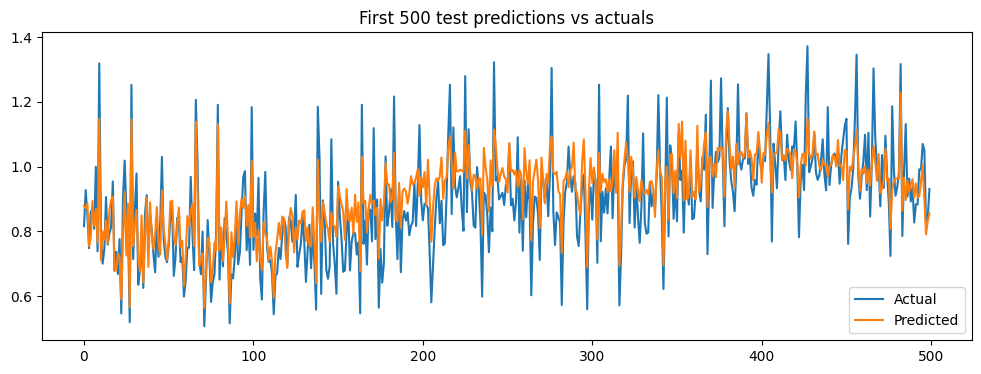

Test error l: 0.7231916357826014
Test error r: 0.11217248283682357
Test error m: 0.558834194186207

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455982 | Test samples: 252370


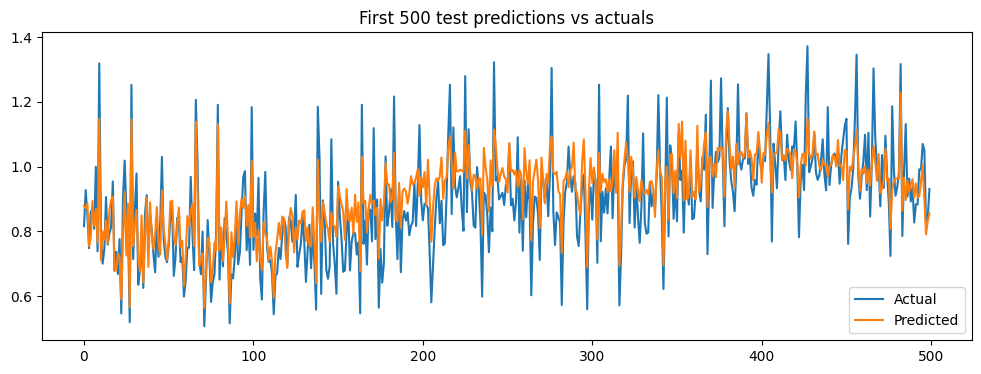

Test error l: 0.5088432417773507
Test error r: -0.8407777470807452
Test error m: 0.24433691480024078

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487089 | Test samples: 282863


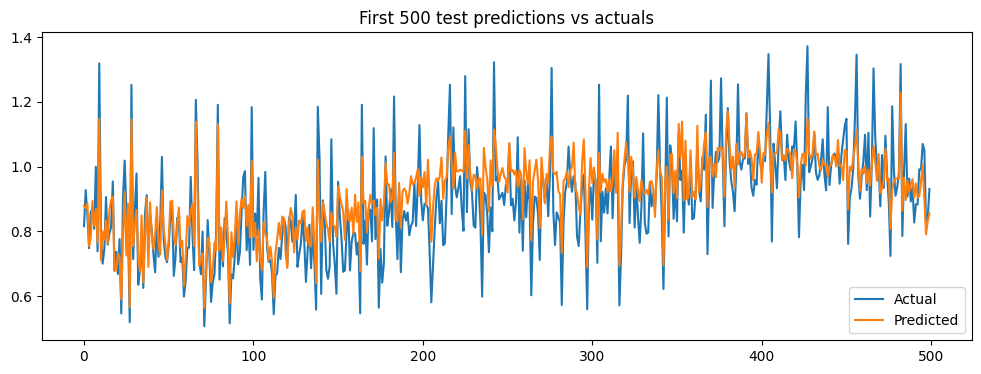

Test error l: 0.4665022170703206
Test error r: 0.43703202649903006
Test error m: 0.6482126330825768

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535233 | Test samples: 289870


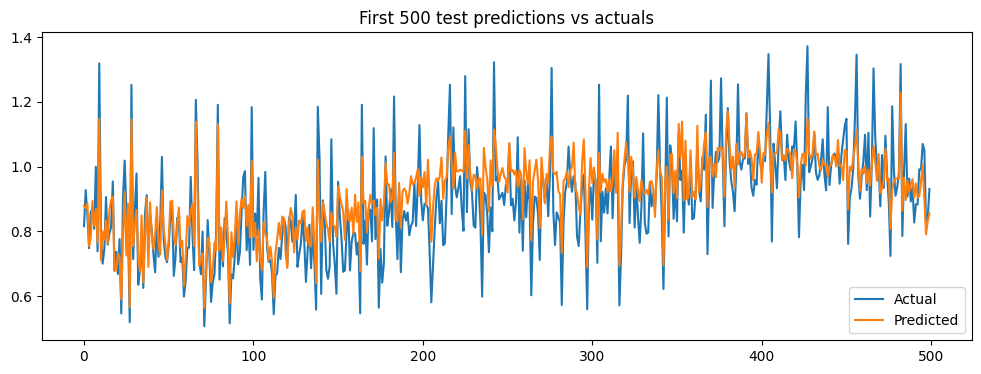

Test error l: 0.6340740603560509
Test error r: 0.35753064631926346
Test error m: 0.4135561820394287

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572733 | Test samples: 304065


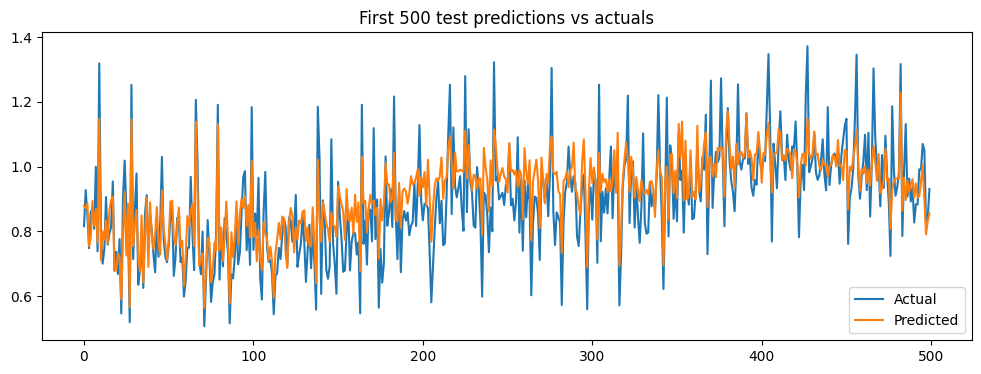

Test error l: 0.6364076984893838
Test error r: 0.20658370961351757
Test error m: 0.6017289494539925
Overall Train Metrics:
MAE: 0.061776595526297794, RMSE: 0.08155932356724416, R²: 0.8189484241673779
Overall Test Metrics:
MAE: 0.08970725682251826, RMSE: 0.12100802539320714, R²: 0.6154000769889973
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_67', 'HourOfWeek_5', 'HourOfWeek_130', 'HourOfWeek_141', 'HourOfWeek_166', 'PriceArea_RO', 'HourOfWeek_162', 'HourOfWeek_51', 'HourOfWeek_83', 'HourOfWeek_138', 'HourOfWeek_152', 'HourOfWeek_116', 'HourOfWeek_32', 'HourOfWeek_104', 'block_6.0:tempbin2', 'HourOfWeek_159', 'HourOfWeek_158', 'PriceArea_BG', 'Month_10', 'HourOfWeek_13', 'HourOfWeek_85', 'PriceArea_IT_SARD', 'HourOfWeek_137', 'HourOfWeek_146', 'block_6.0:Solar_MWh', 'PriceArea_S

In [38]:
dml_pliv_obj_another_set, filtered_data_another_set, importance_df_another_set, fold_metrics_df_another_set, importance_all_folds_df_another_set, fold_coefficients_another_set = dml_rolling_window(processed_data_cleaned, 
                                                                                                                             covariates, 
                                                                                                                             param_dist_xgb=param_dist_xgb,
                                                                                                                             dependent_variable = 'consumption_normalized')
          

In [52]:
manual_params_l = {
    'learning_rate': 0.03,
    'max_depth': 8,
    'n_estimators': 500
}

manual_params_r = {
    'learning_rate': 0.03,
    'max_depth': 8,
    'n_estimators': 500
}

manual_params_m = {
    'learning_rate': 0.01,
    'max_depth': 6,
    'n_estimators': 500
}



Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209955


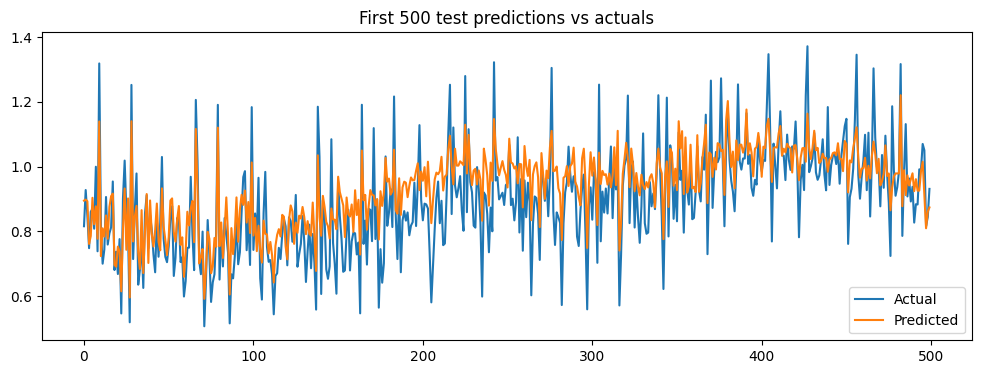

Test error l: 0.7232067160271589
Test error r: 0.31734699200613203
Test error m: 0.5183303491763864

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412297 | Test samples: 203209


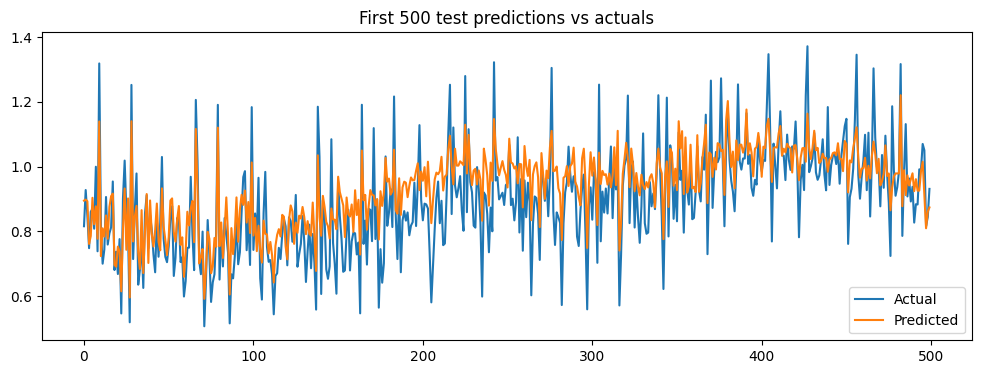

Test error l: 0.5998458336230932
Test error r: -0.28807647584037155
Test error m: 0.486234196619753

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413164 | Test samples: 221271


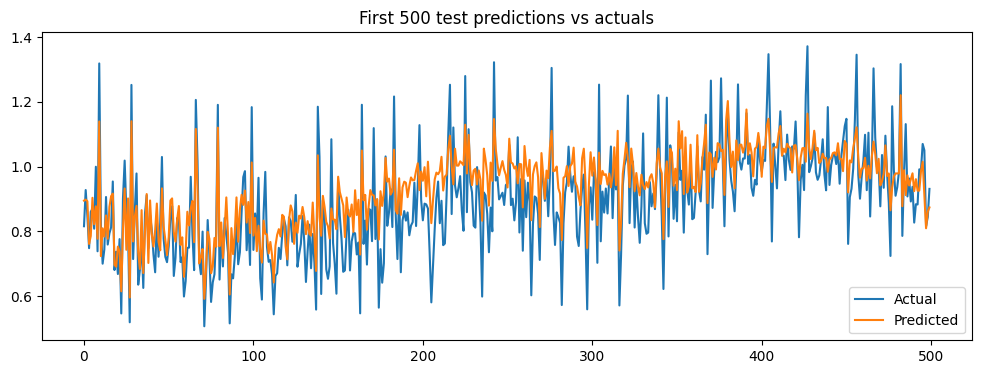

Test error l: 0.6822231015252087
Test error r: 0.2605997193034747
Test error m: 0.5703079028193594

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424480 | Test samples: 234726


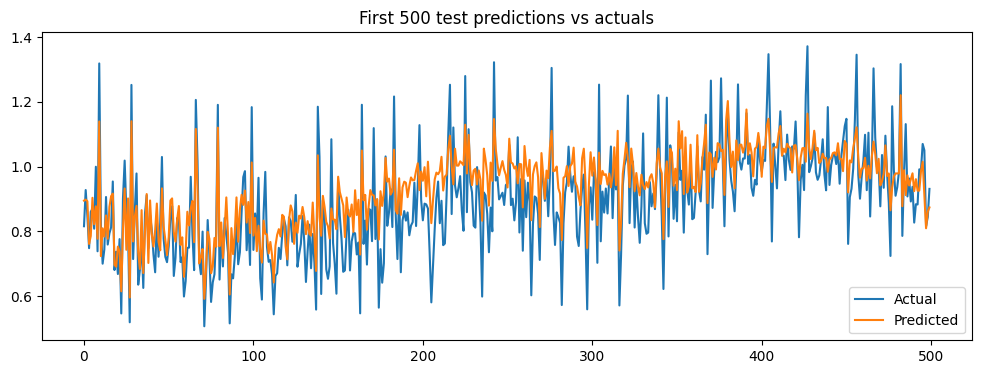

Test error l: 0.723774406001428
Test error r: 0.1136958394919475
Test error m: 0.5587702333777023

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455997 | Test samples: 252358


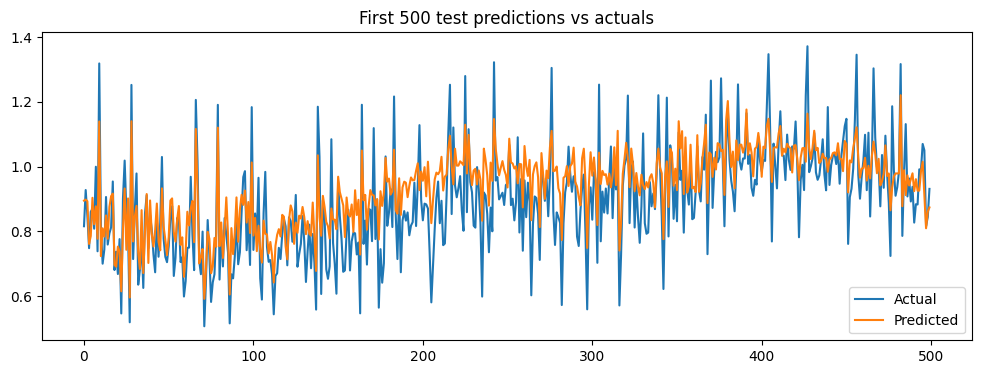

Test error l: 0.5144003990557429
Test error r: -0.8480697517957505
Test error m: 0.24872221635125868

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487084 | Test samples: 282859


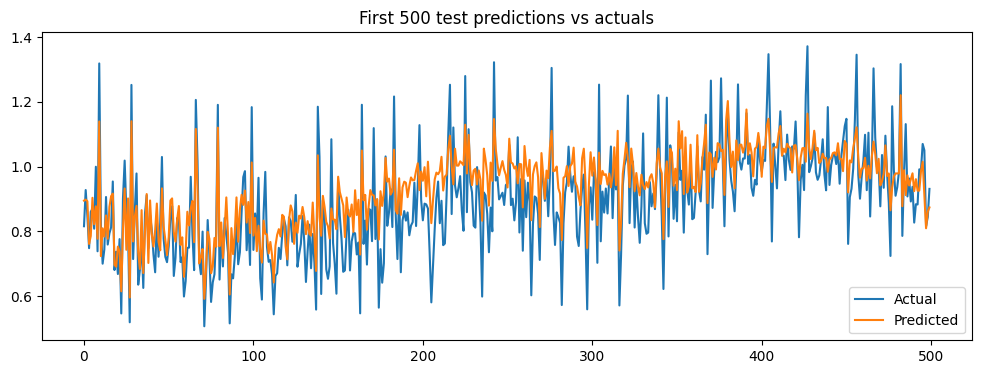

Test error l: 0.5107531751831863
Test error r: 0.43059566256797854
Test error m: 0.6471888453224773

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535217 | Test samples: 289871


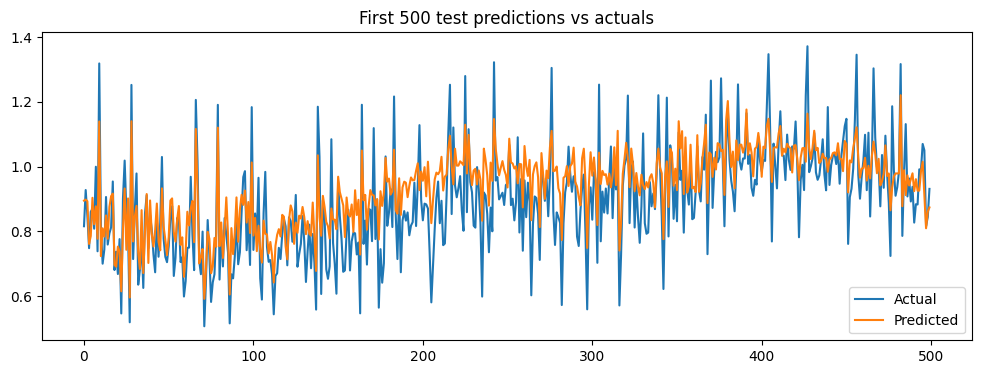

Test error l: 0.6344267990693373
Test error r: 0.36060554162729874
Test error m: 0.4143813245767528

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572730 | Test samples: 304064


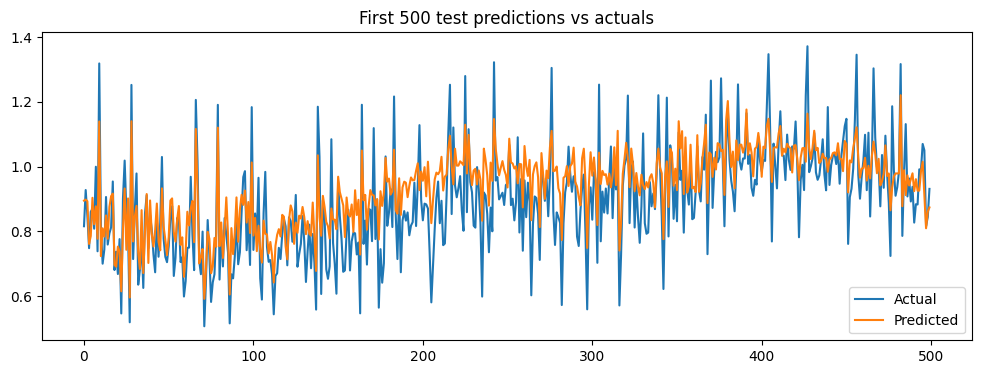

Test error l: 0.6244337349075717
Test error r: 0.20727656697948071
Test error m: 0.6017618169604503
Overall Train Metrics:
MAE: 0.06188609271135799, RMSE: 0.08155284081303112, R²: 0.8187326430183112
Overall Test Metrics:
MAE: 0.08960992012825539, RMSE: 0.1200512605482697, R²: 0.6209657980593624
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_67', 'HourOfWeek_5', 'HourOfWeek_130', 'HourOfWeek_141', 'HourOfWeek_166', 'PriceArea_RO', 'HourOfWeek_162', 'HourOfWeek_51', 'HourOfWeek_83', 'HourOfWeek_138', 'HourOfWeek_152', 'HourOfWeek_116', 'HourOfWeek_32', 'HourOfWeek_104', 'block_6.0:tempbin2', 'HourOfWeek_159', 'HourOfWeek_158', 'PriceArea_BG', 'Month_10', 'HourOfWeek_13', 'HourOfWeek_85', 'PriceArea_IT_SARD', 'HourOfWeek_137', 'HourOfWeek_146', 'block_6.0:Solar_MWh', 'PriceArea_SK'

In [53]:
dml_pliv_obj_another_set, filtered_data_another_set, importance_df_another_set, fold_metrics_df_another_set, importance_all_folds_df_another_set, fold_coefficients_another_set = dml_rolling_window(processed_data, 
                                                                                                                             covariates,
                                                                                                                             dependent_variable = 'consumption_normalized',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

In [78]:
covariates

['HourOfWeek_67',
 'HourOfWeek_5',
 'HourOfWeek_130',
 'HourOfWeek_141',
 'HourOfWeek_166',
 'PriceArea_RO',
 'HourOfWeek_162',
 'HourOfWeek_51',
 'HourOfWeek_83',
 'HourOfWeek_138',
 'HourOfWeek_152',
 'HourOfWeek_116',
 'HourOfWeek_32',
 'HourOfWeek_104',
 'block_6.0:tempbin2',
 'HourOfWeek_159',
 'HourOfWeek_158',
 'PriceArea_BG',
 'Month_10',
 'HourOfWeek_13',
 'HourOfWeek_85',
 'PriceArea_IT_SARD',
 'HourOfWeek_137',
 'HourOfWeek_146',
 'block_6.0:Solar_MWh',
 'PriceArea_SK',
 'HourOfWeek_101',
 'HourOfWeek_29',
 'Month_4',
 'HourOfWeek_59',
 'HourOfWeek_64',
 'PriceArea_IT_SICI',
 'HourOfWeek_77',
 'HourOfWeek_103',
 'HourOfWeek_153',
 'HourOfWeek_24',
 'PriceArea_SE_4',
 'block_5.0:Solar_MWh',
 'HourOfWeek_3',
 'HourOfWeek_22',
 'HourOfWeek_160',
 'PriceArea_LT',
 'HourOfWeek_69',
 'PriceArea_GR',
 'PriceArea_IT_CNOR',
 'HourOfWeek_117',
 'Month_9',
 'HourOfWeek_48',
 'Month_7',
 'block_3.0:Solar_MWh',
 'block_6.0:tempbin',
 'PriceArea_FI',
 'HourOfWeek_9',
 'HourOfWeek_98',
 'H

In [79]:
covariates_regression = [var for var in covariates if var not in ['HourOfWeek_0', 'Month_1']]

In [81]:
outcome_var = 'consumption_normalized'
treatment_var = ['DayAheadPriceEUR']
instrument_vars = ['Total_Wind_Generation']
cluster_var = 'Country'

# Prepare matrices
Y = filtered_data_another_set[outcome_var]
D = filtered_data_another_set[treatment_var]
Z = filtered_data_another_set[instrument_vars]
W = filtered_data_another_set[covariates_regression]

# Fit the IV model
iv_model_check_filter = IV2SLS(dependent=Y, exog=W, endog=D, instruments=Z).fit(cov_type='clustered', clusters=filtered_data_another_set[cluster_var])

# Summary of results
print(iv_model_check_filter.summary)

                            IV-2SLS Estimation Summary                            
Dep. Variable:     consumption_normalized   R-squared:                      0.5610
Estimator:                        IV-2SLS   Adj. R-squared:                 0.5609
No. Observations:                 1998313   F-statistic:                -2.334e+17
Date:                    Sun, Apr 06 2025   P-value (F-stat)                1.0000
Time:                            13:03:07   Distribution:                chi2(238)
Cov. Estimator:                 clustered                                         
                                                                                  
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
HourOfWeek_67           0.3508     0.0238     14.735     0.0000      0.3

In [39]:
fold_coefficients_another_set

[{'Year': 2017,
  'coef': array([-0.00073581]),
  'se': array([0.0001637]),
  't': array([-4.49490011]),
  'p': array([6.96026138e-06])},
 {'Year': 2018,
  'coef': array([-0.00259734]),
  'se': array([0.00127399]),
  't': array([-2.03874251]),
  'p': array([0.04147573])},
 {'Year': 2019,
  'coef': array([0.00012224]),
  'se': array([0.00155627]),
  't': array([0.07854521]),
  'p': array([0.93739437])},
 {'Year': 2020,
  'coef': array([-0.00269823]),
  'se': array([0.00050836]),
  't': array([-5.30774746]),
  'p': array([1.1098827e-07])},
 {'Year': 2021,
  'coef': array([0.00047238]),
  'se': array([7.12536741e-05]),
  't': array([6.6295695]),
  'p': array([3.36667285e-11])},
 {'Year': 2022,
  'coef': array([-0.00037111]),
  'se': array([0.00010065]),
  't': array([-3.68706842]),
  'p': array([0.00022685])},
 {'Year': 2023,
  'coef': array([-0.0004864]),
  'se': array([0.00010729]),
  't': array([-4.53339994]),
  'p': array([5.80417686e-06])},
 {'Year': 2024,
  'coef': array([-0.0011164

In [40]:
filtered_data_another_set.to_csv("first_normalise_another.csv", index=False)
importance_df_another_set.to_csv("first_normalise_importance_df_another.csv", index=False)
fold_coefficients_another_set = pd.DataFrame(fold_coefficients_another_set)
fold_coefficients_another_set.to_csv("fold_coefficients_another_set.csv", index=False)

In [55]:
importance_df_another_set

,Feature,Mean Importance,Std Importance
156,block_1.0:tempbin2,0.050746,0.005784
137,HourOfWeek_149,0.035076,0.003486
204,HourOfWeek_150,0.028248,0.002638
169,HourOfWeek_125,0.027305,0.002395
14,block_6.0:tempbin2,0.022345,0.002768
...,...,...,...
103,PriceArea_LV,0.000000,0.000000
186,block_4.0:tempbin,0.000000,0.000000
210,block_5.0:tempbin,0.000000,0.000000
50,block_6.0:tempbin,0.000000,0.000000


Test - consumption_normalized Metrics:
  MAE: 0.0896
  RMSE: 0.1201
  R²: 0.6210
consumption_normalized Range: Min = 0.0, Max = 2.7072245076569836, Range = 2.7072245076569836
MAE as percentage of range: 3.31%
RMSE as percentage of range: 4.43%


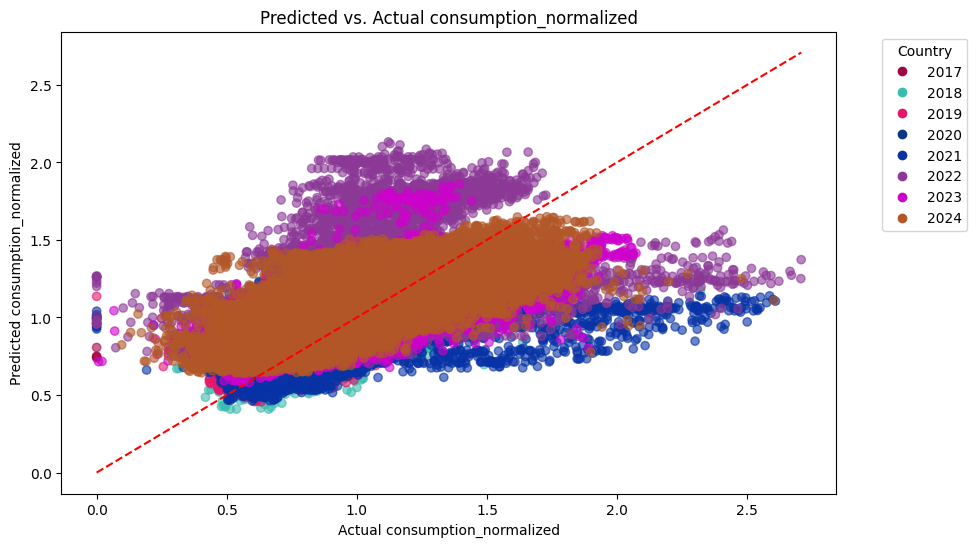

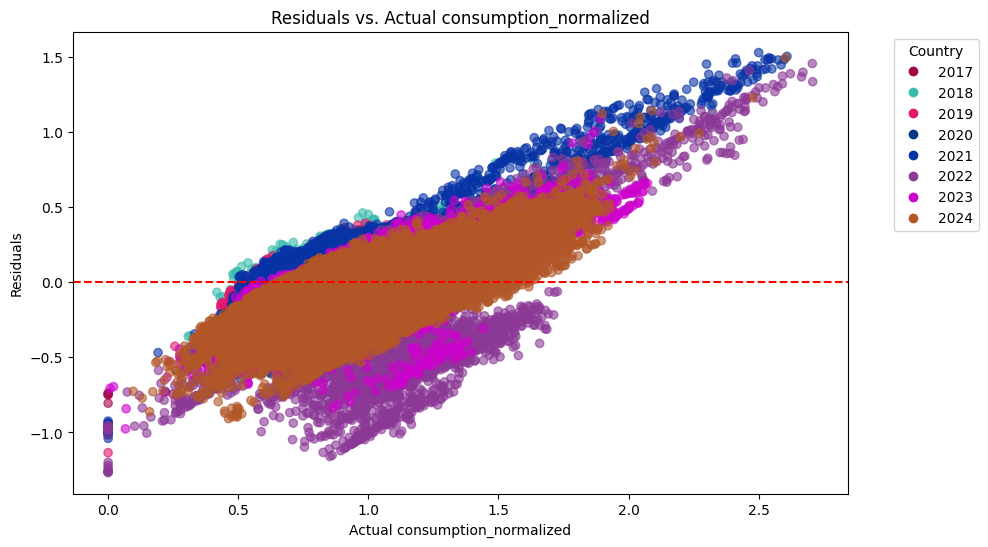

In [56]:
result = evaluate_predictions_country(
    predictions=dml_pliv_obj_another_set.predictions['ml_l'].ravel(),
    true_values=filtered_data_another_set['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_another_set['Year']  # Use the Country column
)

Test - consumption_normalized Metrics:
  MAE: 0.0896
  RMSE: 0.1201
  R²: 0.6210
consumption_normalized Range: Min = 0.0, Max = 2.7072245076569836, Range = 2.7072245076569836
MAE as percentage of range: 3.31%
RMSE as percentage of range: 4.43%


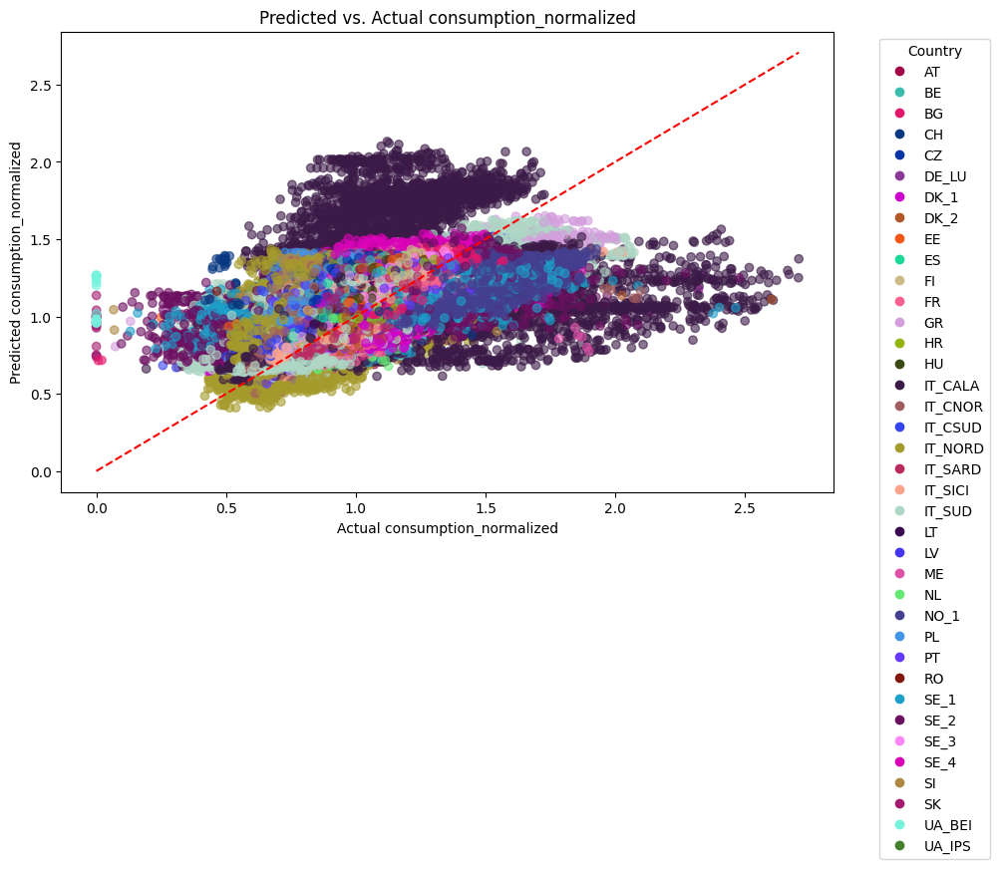

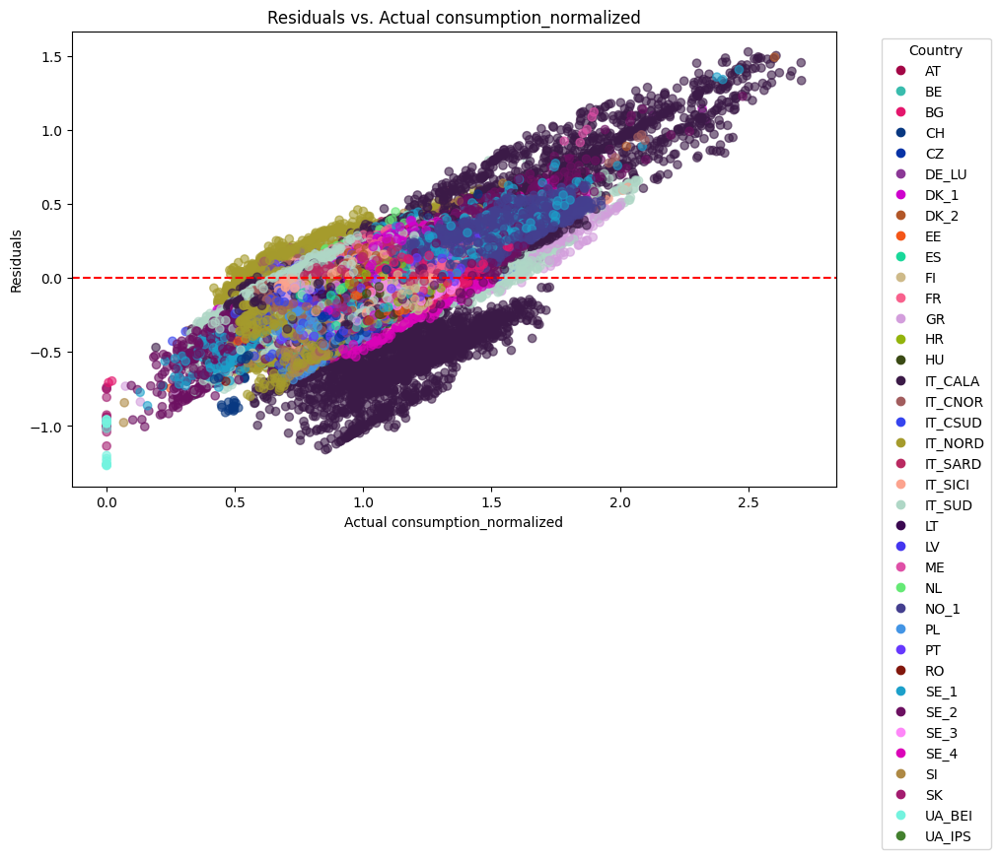

In [57]:
result = evaluate_predictions_country(
    predictions=dml_pliv_obj_another_set.predictions['ml_l'].ravel(),
    true_values=filtered_data_another_set['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_another_set['Country']  # Use the Country column
)

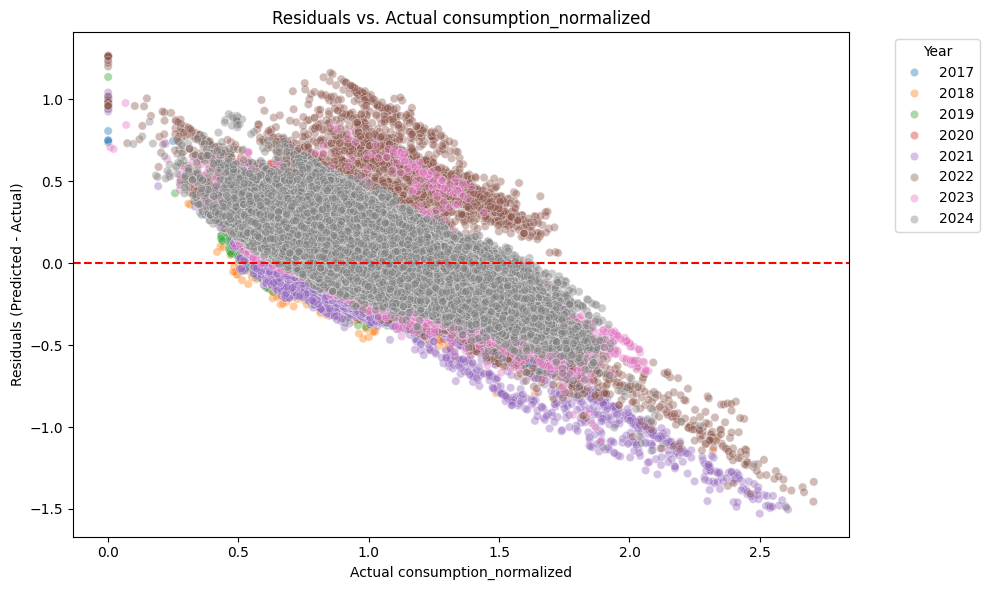

In [58]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data_another_set, x='consumption_normalized', y='Residuals', hue='Year', alpha=0.4, palette='tab10')

plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Actual consumption_normalized')
plt.ylabel('Residuals (Predicted - Actual)')
plt.title('Residuals vs. Actual consumption_normalized')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [44]:
# Define threshold for outliers
threshold = 1.5  # adjust based on your use case

# Find outlier rows based on residuals
outliers = filtered_data_another_set[filtered_data_another_set['Residuals'].abs() > threshold]

# Show summary
print("Number of outliers:", outliers.shape[0])
print(outliers[['Time', 'Country', 'consumption_normalized', 'Prrediction', 'Residuals', 'Year']].sort_values(by='Residuals'))


Number of outliers: 24
                            Time  Country  consumption_normalized  \
Unnamed: 0.1                                                        
1641724.0    2022-02-10 20:00:00     SE_2                4.910286   
1641767.0    2022-02-10 21:00:00     SE_2                4.815290   
1641793.0    2022-02-10 22:00:00     SE_2                4.763157   
1149760.0    2020-02-27 09:00:00     DK_2                4.342587   
NaN          2024-10-22 14:00:00     DK_2                3.692458   
516026.0     2017-05-08 07:00:00     DK_1                2.887625   
685982.0     2018-02-06 12:00:00     DK_2                2.881371   
1599235.0    2021-12-20 16:00:00  IT_CALA                2.718131   
1599314.0    2021-12-20 18:00:00  IT_CALA                2.746298   
1599823.0    2021-12-21 09:00:00  IT_CALA                2.663205   
1598975.0    2021-12-20 08:00:00  IT_CALA                2.601237   
1596874.0    2021-12-17 18:00:00  IT_CALA                2.654755   
1599217.0  

## Importance

In [48]:
# Get top 50 features by mean importance
top_50_features = importance_df_another_set.sort_values(by='Mean Importance', ascending=False)['Feature'].head(50).tolist()


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209955
Best L Parameters: {'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 1000}
Best R Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
Best M Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500}


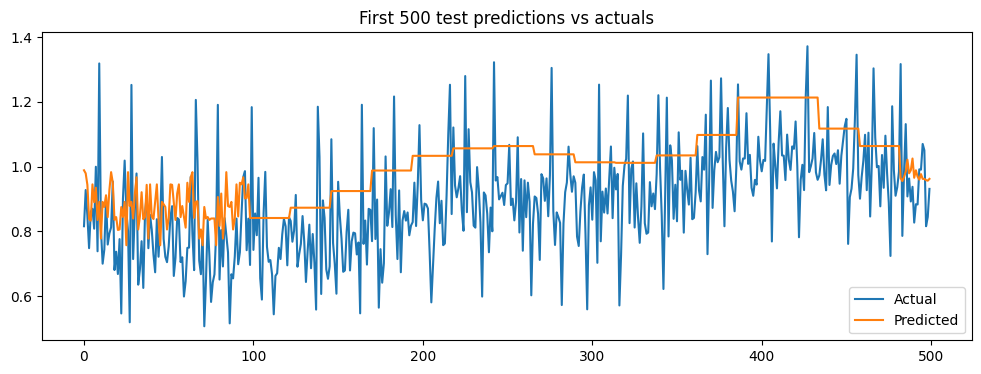

Test error l: 0.5582718461938836
Test error r: 0.07625607154286607
Test error m: 0.0007223010489686432

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412297 | Test samples: 203209


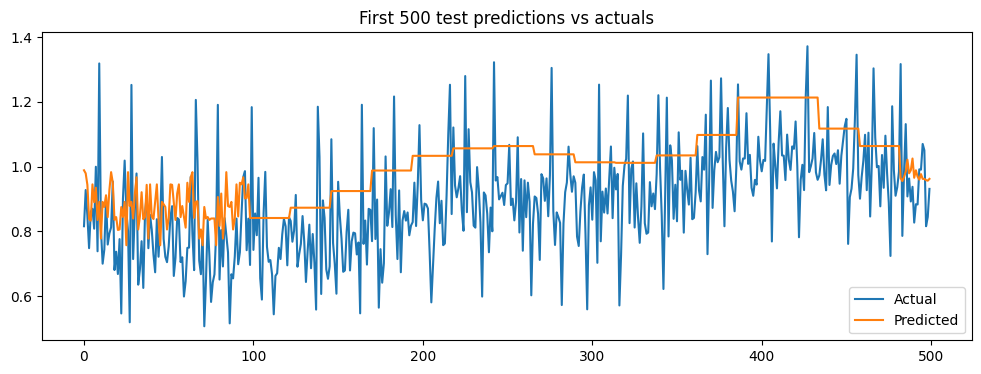

Test error l: 0.5454718521487971
Test error r: -0.3610581193255544
Test error m: 0.00033248926667939216

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413164 | Test samples: 221271


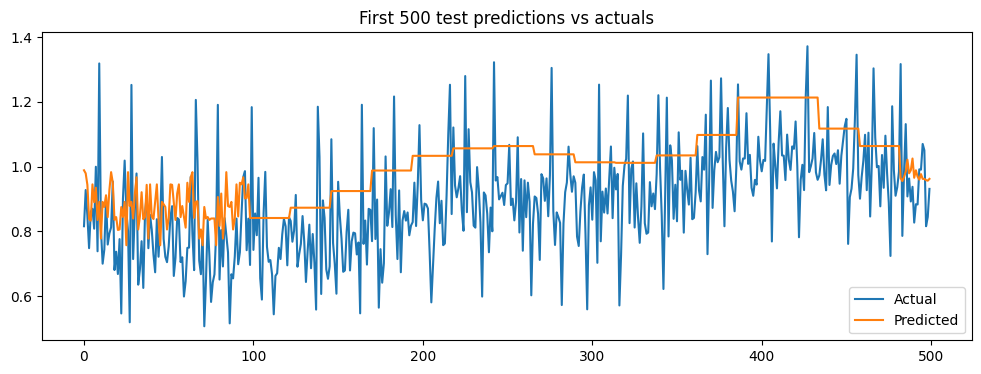

Test error l: 0.5802459254351191
Test error r: 0.2141159230654318
Test error m: -0.0021390560313503393

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424480 | Test samples: 234726


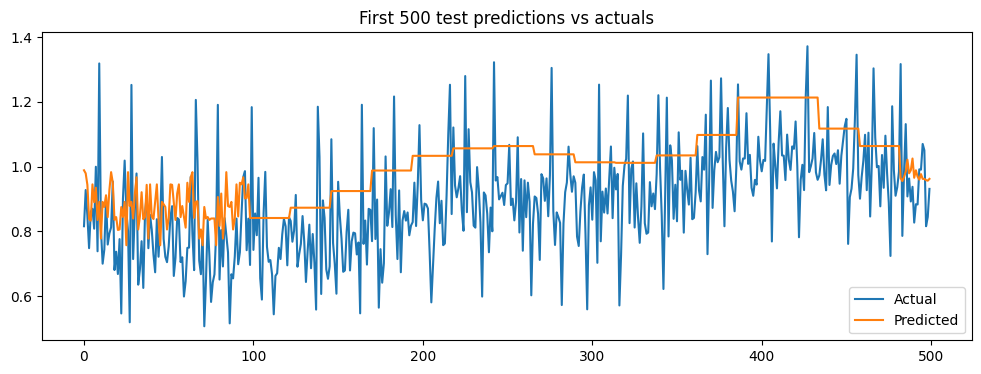

Test error l: 0.5440507333833726
Test error r: -0.3819883770330885
Test error m: 0.0015769195336768904

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455997 | Test samples: 252358


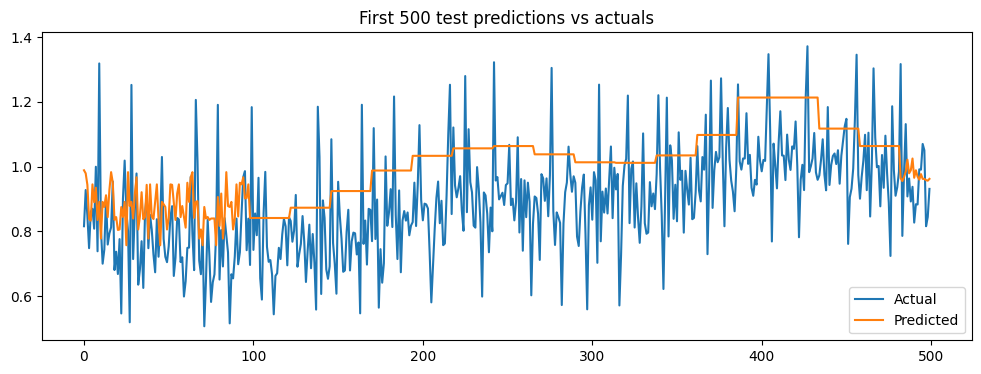

Test error l: 0.5001477218660941
Test error r: -0.7607127151831528
Test error m: 0.005497522502801111

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487084 | Test samples: 282859


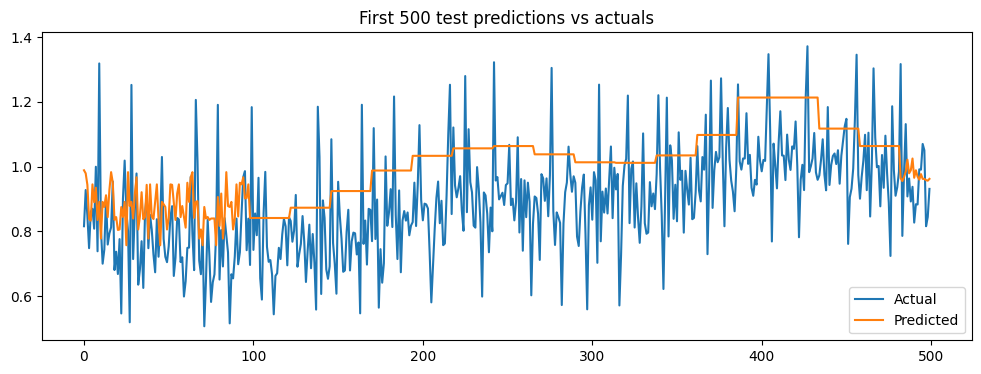

Test error l: 0.4915366247116776
Test error r: -1.1562108387643564
Test error m: 0.010360242557765131

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535217 | Test samples: 289871


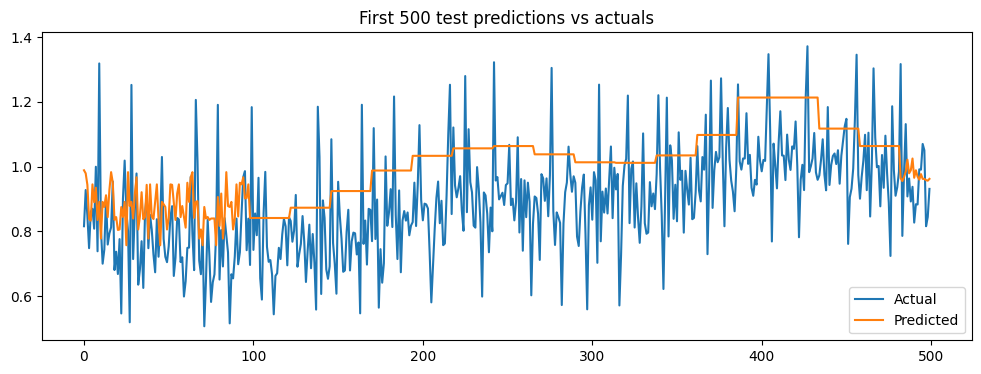

Test error l: 0.4582038652540108
Test error r: -2.688721801213266
Test error m: 0.001859084718131454

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572730 | Test samples: 304064


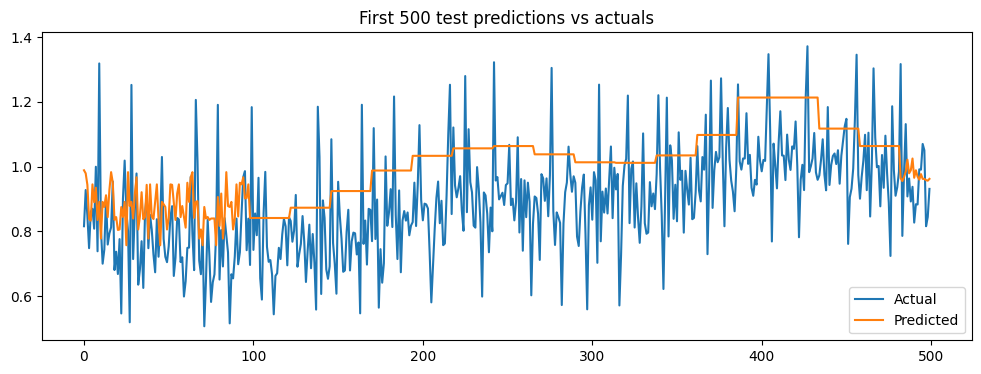

Test error l: 0.4601787604739278
Test error r: -1.87579264489128
Test error m: 0.009988148459402657
Overall Train Metrics:
MAE: 0.09903280108670652, RMSE: 0.13024537696502614, R²: 0.5376551240540673
Overall Test Metrics:
MAE: 0.10364113235779669, RMSE: 0.13664503089686958, R²: 0.5089421734075583
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['block_1.0:tempbin2', 'HourOfWeek_149', 'HourOfWeek_150', 'HourOfWeek_125', 'block_6.0:tempbin2', 'HourOfWeek_126', 'HourOfWeek_151', 'HourOfWeek_157', 'HourOfWeek_158', 'HourOfWeek_156', 'HourOfWeek_155', 'HourOfWeek_154', 'HourOfWeek_159', 'HourOfWeek_153', 'HourOfWeek_164', 'HourOfWeek_140', 'HourOfWeek_56', 'Month_1', 'HourOfWeek_32', 'Month_2', 'HourOfWeek_80', 'HourOfWeek_134', 'HourOfWeek_55', 'HourOfWeek_132', 'HourOfWeek_133', 'HourOfWeek_31', 

In [49]:
dml_pliv_obj_another_set_importance, filtered_data_another_set_importance, importance_df_another_set_importance, fold_metrics_df_another_set_importance, importance_all_folds_df_another_set_importance, fold_coefficients_another_set_importance = dml_rolling_window(
    processed_data,
    top_50_features,  # 👈 only top features
    param_dist_xgb=param_dist_xgb,
    dependent_variable='consumption_normalized'
)


In [50]:
filtered_data_another_set_importance.to_csv("filtered_data_another_set_importance.csv", index=False)
importance_df_another_set_importance.to_csv("importance_df_another_set_importance.csv", index=False)
fold_metrics_df_another_set_importance = pd.DataFrame(fold_metrics_df_another_set_importance)
fold_metrics_df_another_set_importance.to_csv("fold_metrics_df_another_set_importance.csv", index=False)

Test - consumption_normalized Metrics:
  MAE: 0.1036
  RMSE: 0.1366
  R²: 0.5089
consumption_normalized Range: Min = 0.0, Max = 2.7072245076569836, Range = 2.7072245076569836
MAE as percentage of range: 3.83%
RMSE as percentage of range: 5.05%


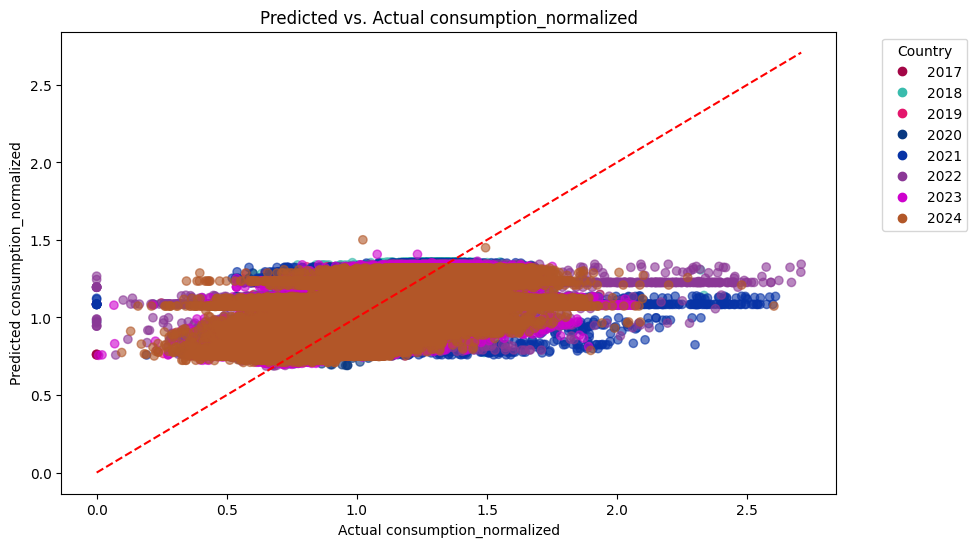

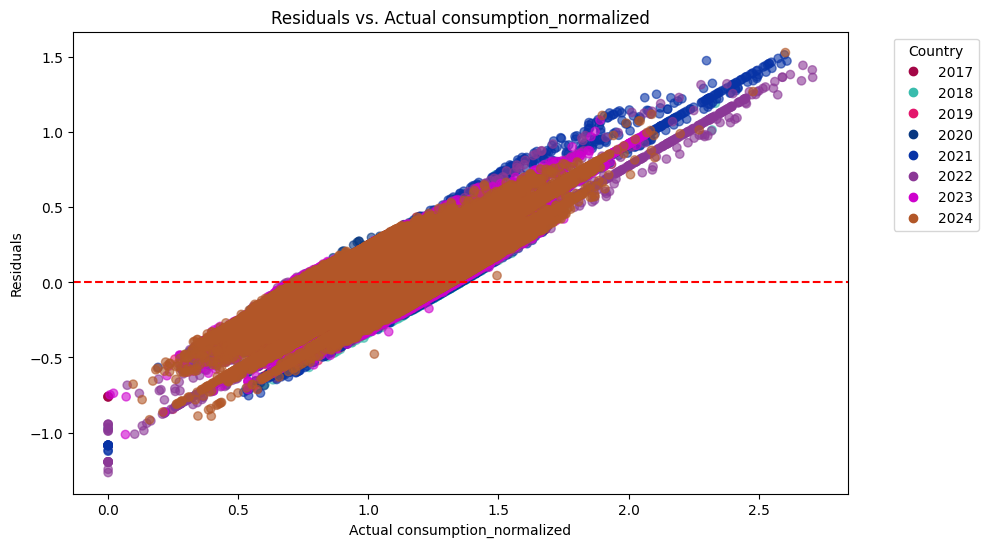

In [51]:
result = evaluate_predictions_country(
    predictions=dml_pliv_obj_another_set_importance.predictions['ml_l'].ravel(),
    true_values=filtered_data_another_set_importance['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_another_set_importance['Year']  # Use the Country column
)

In [82]:
outcome_var = 'consumption_normalized'
treatment_var = ['DayAheadPriceEUR']
instrument_vars = ['Total_Wind_Generation']
cluster_var = 'Country'

# Prepare matrices
Y = filtered_data_another_set_importance[outcome_var]
D = filtered_data_another_set_importance[treatment_var]
Z = filtered_data_another_set_importance[instrument_vars]
W = filtered_data_another_set_importance[top_50_features]

# Fit the IV model
iv_model_check_filter = IV2SLS(dependent=Y, exog=W, endog=D, instruments=Z).fit(cov_type='clustered', clusters=filtered_data_another_set_importance[cluster_var])

# Summary of results
print(iv_model_check_filter.summary)

                            IV-2SLS Estimation Summary                            
Dep. Variable:     consumption_normalized   R-squared:                     -1.7553
Estimator:                        IV-2SLS   Adj. R-squared:                -1.7554
No. Observations:                 1998313   F-statistic:                  9.49e+12
Date:                    Sun, Apr 06 2025   P-value (F-stat)                0.0000
Time:                            13:05:19   Distribution:                 chi2(51)
Cov. Estimator:                 clustered                                         
                                                                                  
                                 Parameter Estimates                                  
                    Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
--------------------------------------------------------------------------------------
block_1.0:tempbin2    -0.3324     0.0477    -6.9697     0.0000     -0.4259 

## Test peak


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209955


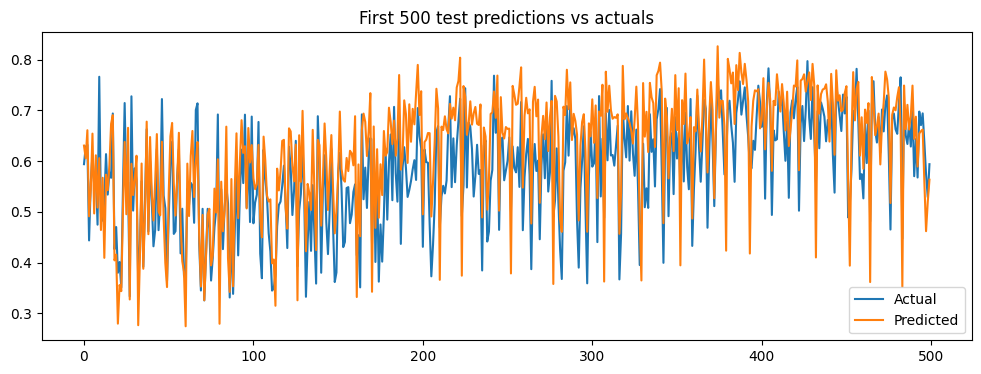

Test error l: 0.6442706868711015
Test error r: 0.31734699200613203
Test error m: 0.5183303491763864

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412297 | Test samples: 203209


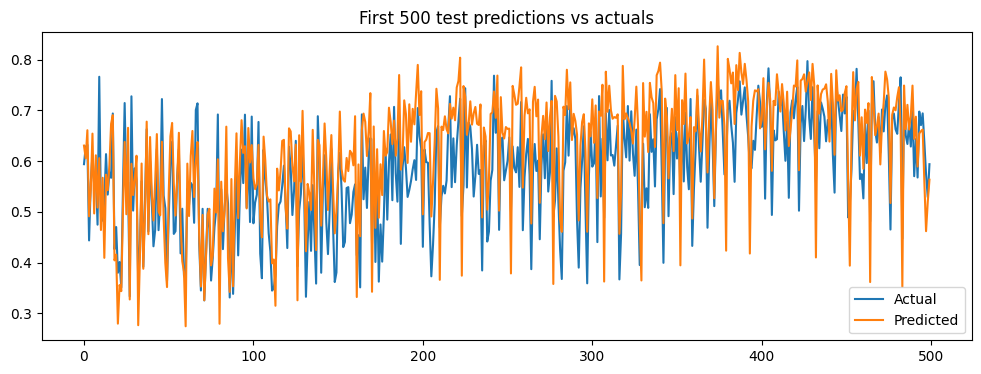

Test error l: 0.6087578432724731
Test error r: -0.28807647584037155
Test error m: 0.486234196619753

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413164 | Test samples: 221271


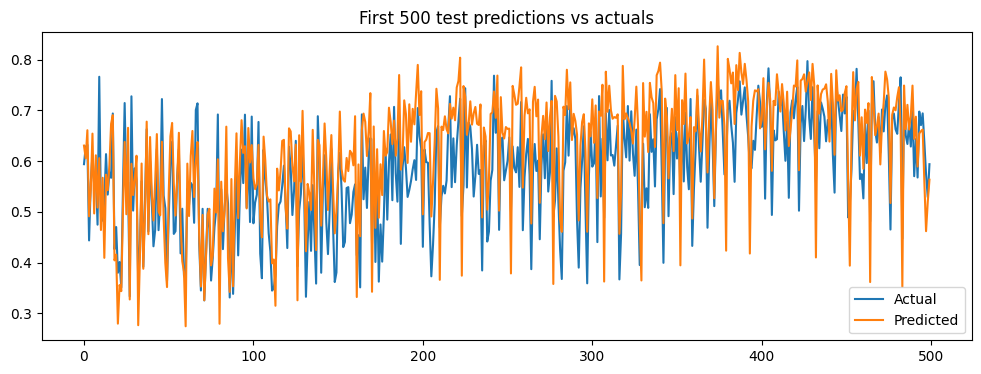

Test error l: 0.6509034886982812
Test error r: 0.2605997193034747
Test error m: 0.5703079028193594

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424480 | Test samples: 234726


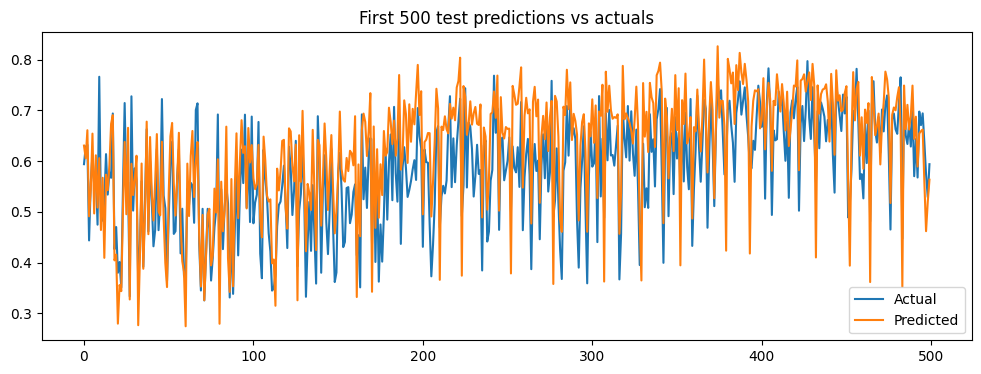

Test error l: 0.6199558053912626
Test error r: 0.1136958394919475
Test error m: 0.5587702333777023

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455997 | Test samples: 252358


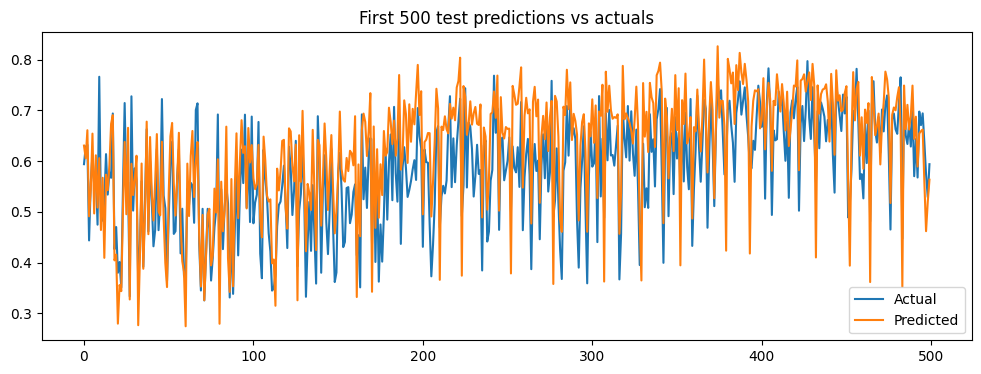

Test error l: 0.49699061520072196
Test error r: -0.8480697517957505
Test error m: 0.24872221635125868

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487084 | Test samples: 282859


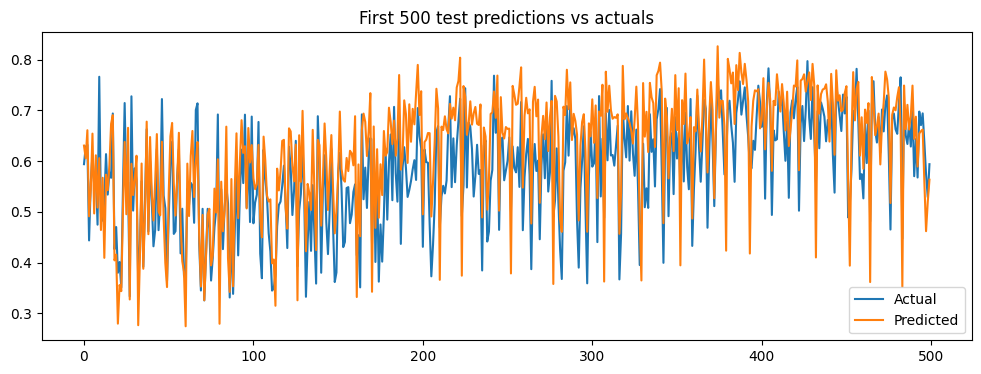

Test error l: 0.43281669234442377
Test error r: 0.43059566256797854
Test error m: 0.6471888453224773

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535217 | Test samples: 289871


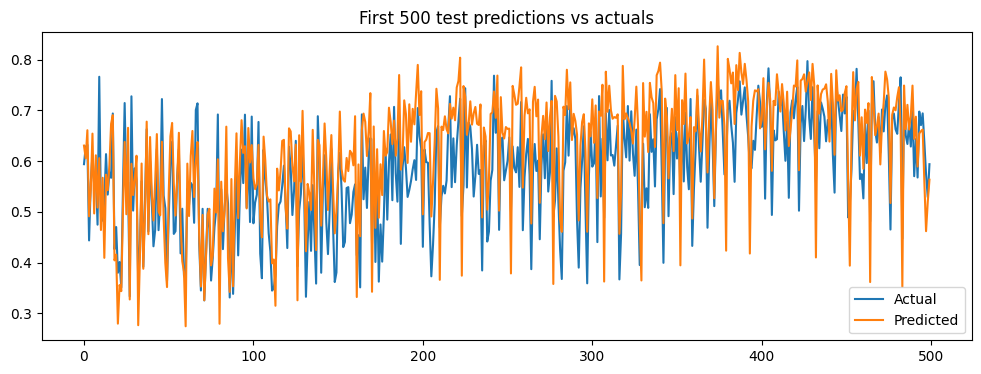

Test error l: 0.614460237755819
Test error r: 0.36060554162729874
Test error m: 0.4143813245767528

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572730 | Test samples: 304064


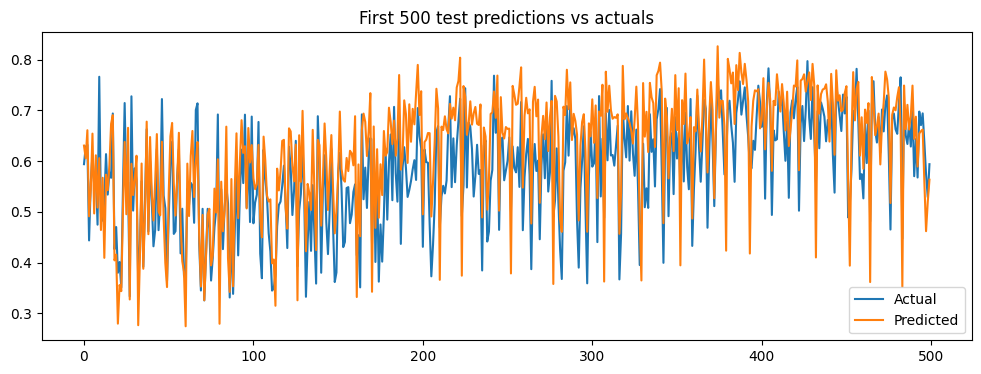

Test error l: 0.3500497336043241
Test error r: 0.20727656697948071
Test error m: 0.6017618169604503
Overall Train Metrics:
MAE: 0.039712738580140655, RMSE: 0.05161053590364646, R²: 0.8620988858469595
Overall Test Metrics:
MAE: 0.0713895181651181, RMSE: 0.09501868035680816, R²: 0.5433041024477265
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_norm_peak
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_67', 'HourOfWeek_5', 'HourOfWeek_130', 'HourOfWeek_141', 'HourOfWeek_166', 'PriceArea_RO', 'HourOfWeek_162', 'HourOfWeek_51', 'HourOfWeek_83', 'HourOfWeek_138', 'HourOfWeek_152', 'HourOfWeek_116', 'HourOfWeek_32', 'HourOfWeek_104', 'block_6.0:tempbin2', 'HourOfWeek_159', 'HourOfWeek_158', 'PriceArea_BG', 'Month_10', 'HourOfWeek_13', 'HourOfWeek_85', 'PriceArea_IT_SARD', 'HourOfWeek_137', 'HourOfWeek_146', 'block_6.0:Solar_MWh', 'PriceArea_SK'

In [59]:
dml_pliv_obj_peak, filtered_data_peak, importance_df_peak, fold_metrics_df_peak, importance_all_folds_df_peak, fold_coefficients_peak = dml_rolling_window(processed_data, 
                                                                                                                             covariates,
                                                                                                                             dependent_variable = 'consumption_norm_peak',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

In [ ]:
outcome_var = 'consumption_normalized'
treatment_var = ['DayAheadPriceEUR']
instrument_vars = ['Total_Wind_Generation']
cluster_var = 'Country'

# Prepare matrices
Y = filtered_data_another_set_importance[outcome_var]
D = filtered_data_another_set_importance[treatment_var]
Z = filtered_data_another_set_importance[instrument_vars]
W = filtered_data_another_set_importance[top_50_features]

# Fit the IV model
iv_model_check_filter = IV2SLS(dependent=Y, exog=W, endog=D, instruments=Z).fit(cov_type='clustered', clusters=filtered_data_another_set_importance[cluster_var])

# Summary of results
print(iv_model_check_filter.summary)

In [62]:
filtered_data_peak.columns

Index(['Unnamed: 0', 'Time', 'ConsumptionValue', 'DayAheadPriceEUR',
       'WeatherWindSpeed', 'WeatherTemperature', 'Year', 'Day', 'Hour',
       'WeatherTemperature_F',
       ...
       'block_4.0:tempbin2', 'block_4.0:Solar_MWh', 'block_5.0:tempbin',
       'block_5.0:tempbin2', 'block_5.0:Solar_MWh', 'block_6.0:tempbin',
       'block_6.0:tempbin2', 'block_6.0:Solar_MWh', 'Prrediction',
       'Residuals'],
      dtype='object', length=277)

Test - consumption_norm_peak Metrics:
  MAE: 0.0714
  RMSE: 0.0950
  R²: 0.5433
consumption_norm_peak Range: Min = 0.0, Max = 1.0, Range = 1.0
MAE as percentage of range: 7.14%
RMSE as percentage of range: 9.50%


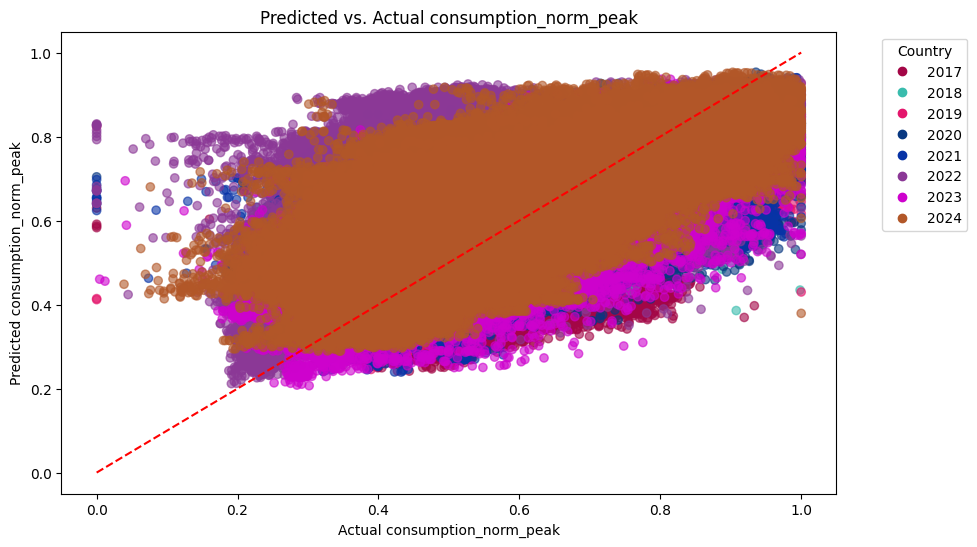

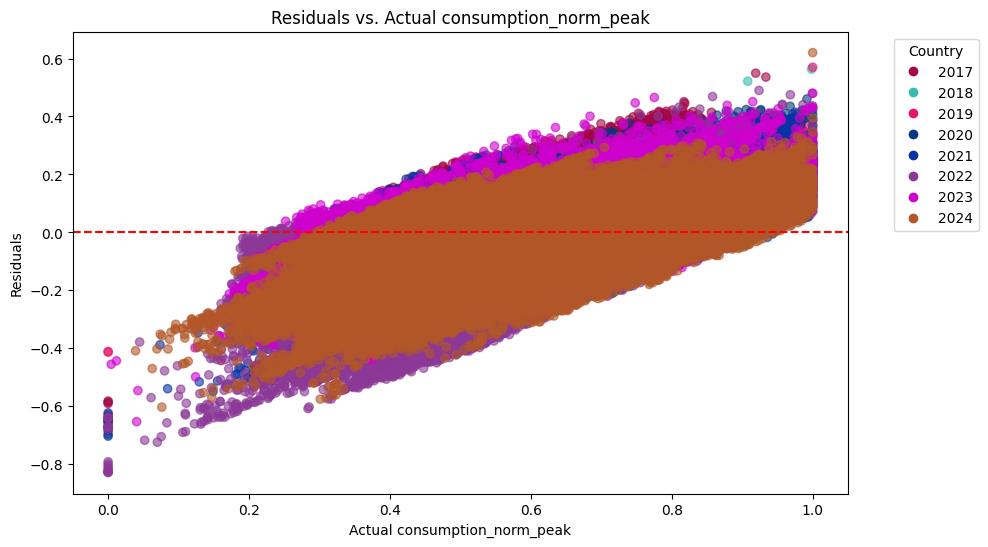

In [64]:
result = evaluate_predictions_country(
    predictions=filtered_data_peak['Prrediction'],
    true_values=filtered_data_peak['consumption_norm_peak'],
    target_name="consumption_norm_peak",
    country_values=filtered_data_peak['Year']  # Use the Country column
)

In [65]:
top_50_features_peak = importance_df_peak.sort_values(by='Mean Importance', ascending=False)['Feature'].head(50).tolist()


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401818 | Test samples: 209955


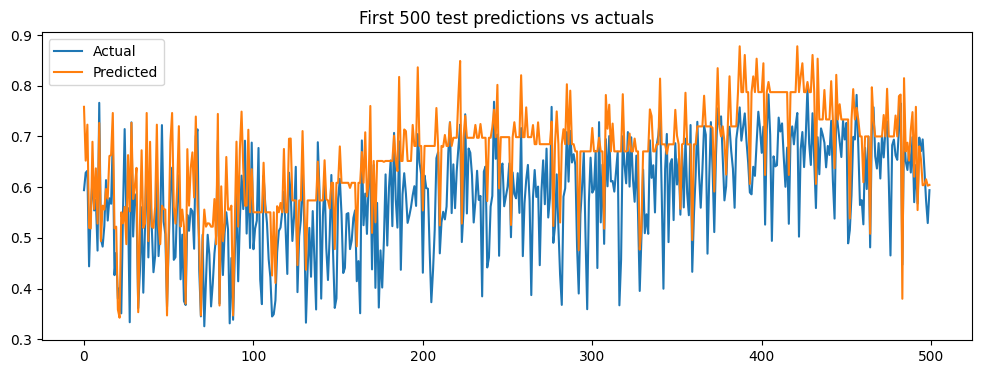

Test error l: 0.5752533732353095
Test error r: 0.13097402593902174
Test error m: 0.5751305773607827

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412297 | Test samples: 203209


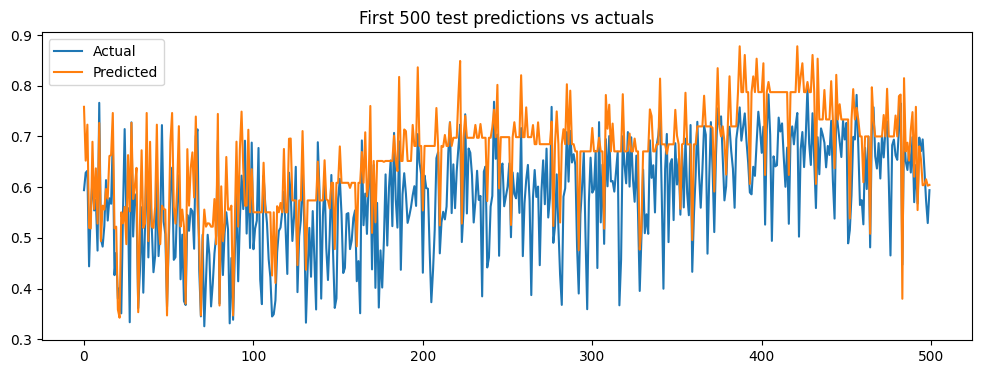

Test error l: 0.5602492643846936
Test error r: -0.3081460804315628
Test error m: 0.6071753104340669

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413164 | Test samples: 221271


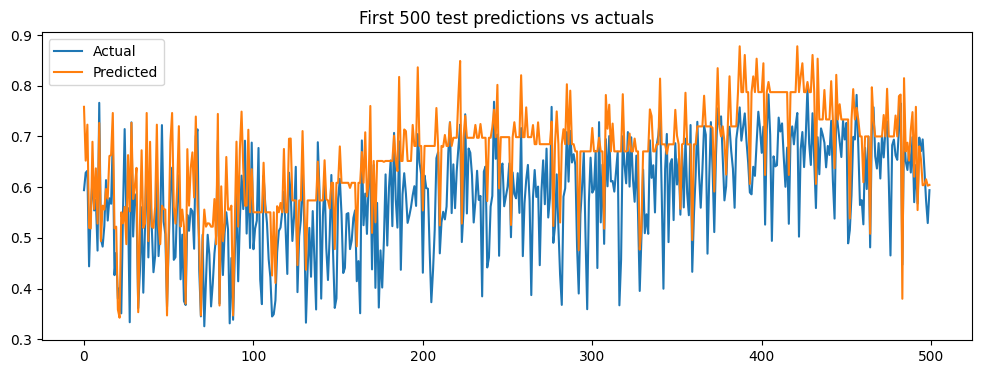

Test error l: 0.5949309682930333
Test error r: 0.23381669105475444
Test error m: 0.6206072719338607

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424480 | Test samples: 234726


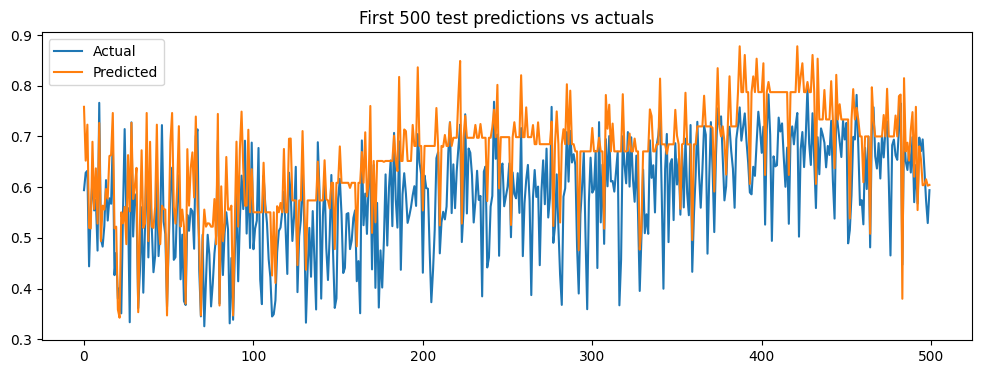

Test error l: 0.41564185680496346
Test error r: -0.38670000142789074
Test error m: 0.635581131551545

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455997 | Test samples: 252358


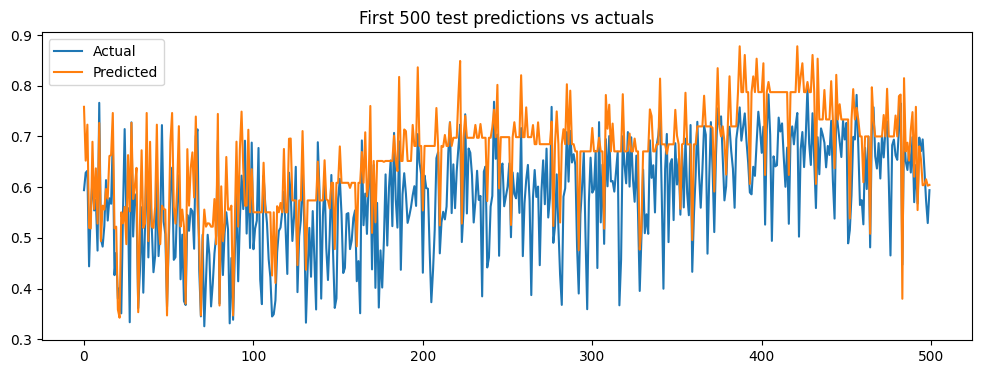

Test error l: 0.4549359329535354
Test error r: -0.7473680045622617
Test error m: 0.5964886784969192

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487084 | Test samples: 282859


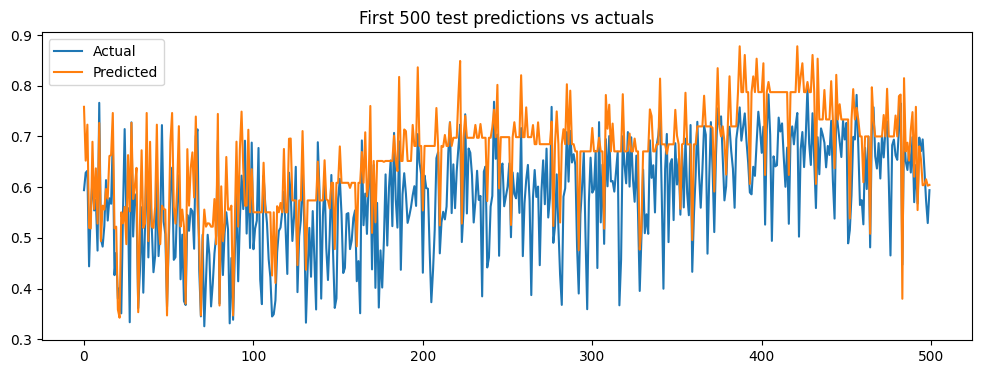

Test error l: 0.4960239287259556
Test error r: -1.1320167836190764
Test error m: 0.6197559073127794

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535217 | Test samples: 289871


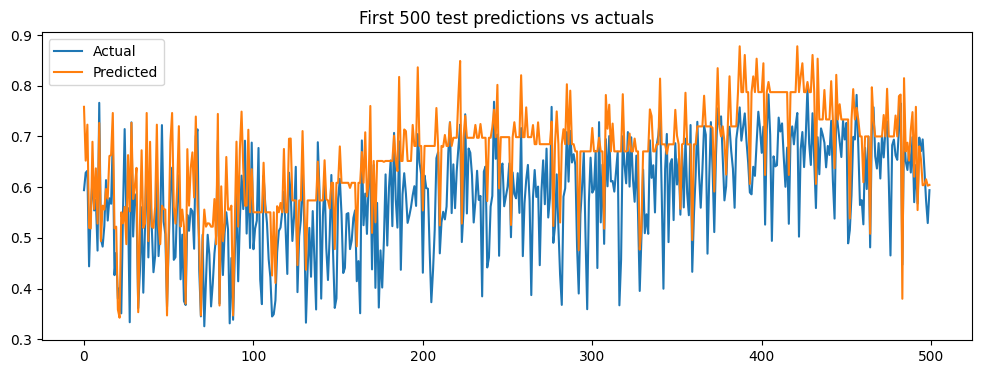

Test error l: 0.44103090157009595
Test error r: -2.946988155254391
Test error m: 0.586277977287144

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572730 | Test samples: 304064


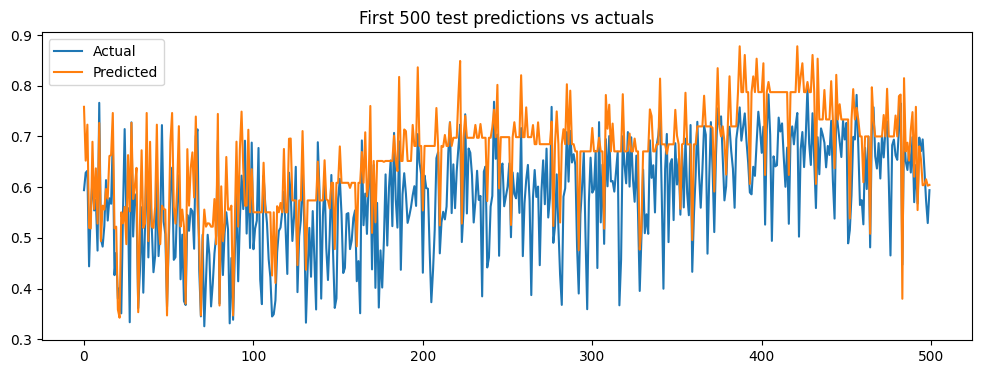

Test error l: 0.3925143815404891
Test error r: -1.9648866465956747
Test error m: 0.6189001222916052
Overall Train Metrics:
MAE: 0.07004914864057563, RMSE: 0.09008079913365824, R²: 0.5798972752943011
Overall Test Metrics:
MAE: 0.07703531721166156, RMSE: 0.10019378712576053, R²: 0.4922023273161449
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_norm_peak
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['block_1.0:tempbin2', 'PriceArea_IT_CALA', 'HourOfWeek_149', 'PriceArea_DK_1', 'HourOfWeek_150', 'HourOfWeek_125', 'PriceArea_BE', 'PriceArea_IT_SUD', 'block_6.0:tempbin2', 'HourOfWeek_158', 'HourOfWeek_157', 'PriceArea_DE_LU', 'HourOfWeek_56', 'HourOfWeek_159', 'HourOfWeek_151', 'HourOfWeek_126', 'HourOfWeek_134', 'PriceArea_SK', 'HourOfWeek_156', 'HourOfWeek_32', 'HourOfWeek_153', 'HourOfWeek_80', 'HourOfWeek_155', 'HourOfWeek_135', 'HourOfWeek_133', '

In [66]:
dml_pliv_obj_peak, filtered_data_peak, importance_df_peak, fold_metrics_df_peak, importance_all_folds_df_peak, fold_coefficients_peak = dml_rolling_window(processed_data, 
                                                                                                                             top_50_features_peak,
                                                                                                                             dependent_variable = 'consumption_norm_peak',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

Test - consumption_norm_peak Metrics:
  MAE: 0.0770
  RMSE: 0.1002
  R²: 0.4922
consumption_norm_peak Range: Min = 0.0, Max = 1.0, Range = 1.0
MAE as percentage of range: 7.70%
RMSE as percentage of range: 10.02%


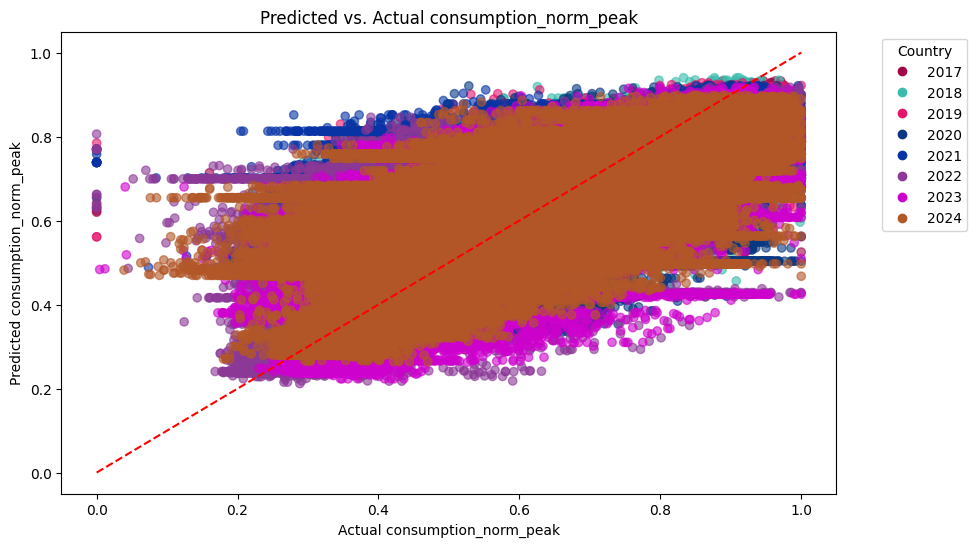

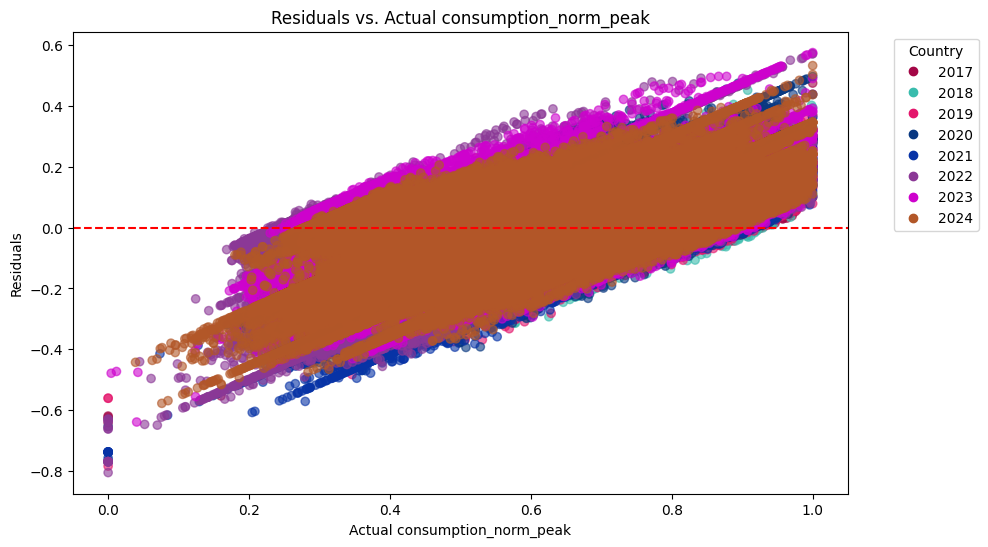

In [68]:
result = evaluate_predictions_country(
    predictions=filtered_data_peak['Prrediction'],
    true_values=filtered_data_peak['consumption_norm_peak'],
    target_name="consumption_norm_peak",
    country_values=filtered_data_peak['Year']  # Use the Country column
)

In [77]:
it = filtered_data_peak[filtered_data_peak['Country'] == 'IT_CALA']
it

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:tempbin2,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Prrediction,Residuals
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
1356091.0,2018302.0,2020-12-31 23:00:00,540.00,50.87,5.195358,281.734772,2020,31.0,23.0,47.452589,...,0.0,0.0,0.0,0.000000,0.0,3.0,2.251748,0.0,0.562298,-0.437702
1356118.0,2018343.0,2021-01-01 01:00:00,440.00,44.68,4.772419,283.257233,2021,1.0,1.0,50.193019,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.513084,0.274989
1356148.0,2018382.0,2021-01-01 02:00:00,395.00,42.92,4.188156,283.162781,2021,1.0,2.0,50.023005,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.513084,0.299340
1356176.0,2018420.0,2021-01-01 03:00:00,367.00,40.39,3.751317,283.128296,2021,1.0,3.0,49.960933,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.513084,0.314491
1356204.0,2018461.0,2021-01-01 04:00:00,366.00,40.20,3.401026,283.130066,2021,1.0,4.0,49.964119,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.513084,0.315032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 19:00:00,702.00,164.94,1.656031,285.103119,2024,31.0,19.0,53.515614,...,0.0,0.0,4.0,2.863921,0.0,0.0,0.000000,0.0,0.496905,-0.057160
NaN,NaN,2024-12-31 20:00:00,626.00,150.00,1.603330,284.882294,2024,31.0,20.0,53.118129,...,0.0,0.0,4.0,2.821536,0.0,0.0,0.000000,0.0,0.496905,0.002825
NaN,NaN,2024-12-31 21:00:00,580.00,141.00,1.583712,284.716614,2024,31.0,21.0,52.819905,...,0.0,0.0,0.0,0.000000,0.0,4.0,2.789942,0.0,0.356645,-0.101130


In [73]:
print(it.columns.tolist())


['Unnamed: 0', 'Time', 'ConsumptionValue', 'DayAheadPriceEUR', 'WeatherWindSpeed', 'WeatherTemperature', 'Year', 'Day', 'Hour', 'WeatherTemperature_F', 'Solar_MWh', 'Wind_Offshore', 'Wind_Onshore', 'ym', 'tempbin', 'tempbin2', 'YearMonthDay', 'Price_Area', 'Price_gas', 'Price_coal', 'Price_EUA', 'IsHoliday', 'B16', 'B18', 'B19', 'Price_gas_ttf', 'Country', 'consumption_normalized', 'consumption_norm_peak', 'Total_Wind_Generation', 'block_1.0', 'block_2.0', 'block_3.0', 'block_4.0', 'block_5.0', 'block_6.0', 'PriceArea_AT', 'PriceArea_BE', 'PriceArea_BG', 'PriceArea_CH', 'PriceArea_CZ', 'PriceArea_DE_LU', 'PriceArea_DK_1', 'PriceArea_DK_2', 'PriceArea_EE', 'PriceArea_ES', 'PriceArea_FI', 'PriceArea_FR', 'PriceArea_GR', 'PriceArea_HR', 'PriceArea_HU', 'PriceArea_IT_CALA', 'PriceArea_IT_CNOR', 'PriceArea_IT_CSUD', 'PriceArea_IT_NORD', 'PriceArea_IT_SARD', 'PriceArea_IT_SICI', 'PriceArea_IT_SUD', 'PriceArea_LT', 'PriceArea_LV', 'PriceArea_ME', 'PriceArea_NL', 'PriceArea_NO_1', 'PriceArea_P

In [60]:
processed_data['Lag1_Consumption']

KeyError: 'Lag1_Consumption'

In [ ]:
processed_data_peak, covariates_peak = prepare_data_with_dummies_and_interactions(
    filtered_data_with_holidays,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_norm_peak'
)

In [ ]:
processed_data_peak['Lag1_Consumption']

In [ ]:
param_dist_xgb = {
    'n_estimators': [500, 700, 1000],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.03]
}
